## Best Fit
We want to learn a hypothesis that fits the future data best. To make that precise we need a __stationary assumption__ to define “future data” and “best.” We make the stationarity assumption: that there is a probability distribution over examples that remains stationary over time.

Assumptions are called to be independent and identically distributed, connecting the past to the future/ without some such connection, all
bets are off—the future could be anything.

We define the error rate of a hypothesis as the proportion of mistakes it makes — the proportion of times that h(x) != y for an (x, y) example. Now, just because a hypothesis h has a low error rate on the training set does not mean that it will generalize well. 

### Overfitting
Happens when the model is too complex relative to the amount and noisiness of the training data.

A general phenomenon, overfitting occurs with all types of learners, even when the target function is not at all random. Overfitting becomes more likely as the
hypothesis space and the number of input attributes grows, and less likely as we increase the number of training examples  (RUSSEL and NORVIG, XXX, p.713). .
***
1. Simplify the model by selecting one with fewer parameters (e.g., a linear model rather than a high-degree polynomial model), by reducing the number of attributes in the training data, or by constraining the model.
2. Gather more training data.
3. Reduce the noise in the training data (e.g., fix data errors and remove outliers).

### Regularization
Constraining a model to make it simpler and reduce the risk of overfitting is called regularization. 

The process of explicitly penalizing complex hypotheses is called regularization (because it looks for a function that is more regular, or less complex). The choice of regularization function depends on the hypothesis space. (RUSSEL and NORVIG, XXX, p.713). 

The amount of regularization to apply during learning can be controlled by a hyper‐
parameter. 

### Underfitting
The opposite of overfitting: it occurs when your model is too simple to learn the underlying structure of the data. For example, a linear model of life satisfaction is prone to underfit; reality is just more complex than the model, so its predictions are bound to be inaccurate, even on the training examples.
***
1. Select a more powerful model, with more parameters;
2. Feed better features to the learning algorithm (feature engineering).;
3. Reduce the constraints on the model (e.g., reduce the regularization hyperparameter).

It is common to use 80% of the data for training and hold out 20%
for testing. However, this depends on the size of the dataset: if it
contains 10 million instances, then holding out 1% means your test
set will contain 100,000 instances, probably more than enough to
get a good estimate of the generalization error.

### Holdout validation

You simply hold out part of the training set to evaluate several candidate models and select the best one. The new held-out set is called the __validation set__ (or sometimes the development set, or dev set). More specifically, you train multiple models with various hyperparameters on the reduced training set (i.e., the full training set minus the validation set), and you select the model that performs best on the validation set. After this __holdout validation process__, you train the best model on the full training set (including the validation set), and this gives you the final model. Lastly, you evaluate this final model on the test set to get an estimate of the generalization error.

If the validation set is too small, then model evaluations will be imprecise: you may end up selecting a suboptimal model by mistake.

Conversely, if the validation set is too large, then the remaining training set will be much smaller than the full training set. Why is this bad? Well, since the final model will be trained on the full training set, it is not ideal to compare candidate models trained on a much smaller training set. It would be like selecting the fastest sprinter to participate in a marathon.

This method has the disadvantage that it fails to use all the available data; if we use half the data for the test set, then we are only training on half
the data, and we may get a poor hypothesis. On the other hand, if we reserve only 10% of the data for the test set, then we may, by statistical chance, get a poor estimate of the actual accuracy (RUSSEL and NORVIG, XXX, p.708).

### Cross-validation

One way to solve this problem is to perform repeated __cross-validation__, using many small validation sets. Each model is evaluated once per validation set after it is trained on the rest of the data. By averaging out all the evaluations of a model, you get a much more accurate measure of its performance. There is a drawback, however: the training time is multiplied by the number of validation sets.

We can squeeze more out of the data and still get an accurate estimate using a technique __k-fold cross-validation__ called k-fold cross-validation. The idea is that each example serves double duty—as training data and test data. First we split the data into __k__ equal subsets. We then perform __k__ rounds of learning; on each round __1/k__ of the data is held out as a test set and the remaining examples are used as training data. The average test set score of the __k__ rounds should then be a better estimate than a single score. Popular values for k are 5 and 10—enough to give an estimate that is statistically likely to be accurate, at a cost of 5 to 10 times longer computation time (RUSSEL and NORVIG, XXX, p.708).

__Leave-one-out Cross-Validation__ The extreme is k = n, also known as leave-one-out cross-validation or __LOOCV__

****

This solution usually works quite well. However, if the validation set is too small, then
model evaluations will be imprecise: you may end up selecting a suboptimal model by
mistake. Conversely, if the validation set is too large, then the remaining training set
will be much smaller than the full training set. Why is this bad? Well, since the final
model will be trained on the full training set, it is not ideal to compare candidate
models trained on a much smaller training set. It would be like selecting the fastest
sprinter to participate in a marathon. One way to solve this problem is to perform
repeated cross-validation, using many small validation sets. Each model is evaluated
once per validation set after it is trained on the rest of the data. By averaging out all
the evaluations of a model, you get a much more accurate measure of its perfor‐
mance. There is a drawback, however: the training time is multiplied by the number
of validation sets.

### Sampling
1. __Sampling noise__ - Nonrepresentative data as a result of chance  if the sample is too small
2. __Sampling bias__ - Nonrepresentative if the sampling method is flawed even in very large samples
***
If some instances are clearly outliers, it may help to simply discard them or try to fix the errors manually.

If some instances are missing a few features (e.g., 5% of your customers did not specify their age), you must decide whether you want to ignore this attribute alto gether, ignore these instances, fill in the missing values (e.g., with the median age), or train one model with the feature and one model without it.

In [ ]:
import numpy as np
import scipy
import os
import tarfile
import urllib
import tqdm

In [ ]:
import pandas as pd

In [ ]:
dataset = pd.read_excel('CENSO-BASE DE DADOS-para dashboard-r01.xlsx', header=1, index_col=0)

In [ ]:
dataset

### Feature engineering
Coming up with a good set of features to train on.
***
1. __Feature selection__  - Selecting the most useful features to train on among existing features. Another way to simplify models, reducing the dimensions that the models work with, when discarding discard attributes that appear to be irrelevant. (RUSSEL and NORVIG, XXX, p.713).; 
2. __Feature extraction__ - Combining existing features to produce a more useful one—as we saw earlier, dimensionality reduction algorithms can help; 
3. Creating new features by gathering new data

## Feature Selection

In [ ]:
tags = [
    "UF","DATA_NASC_ANO","ATIV_ALTERNATIVA_SIM","ATIV_ALTERNATIVA_NAO","ATIV_ALTERNATIVA_NULO",
    "RENDA_FONTE_APOSENTADO","RENDA_FONTE_ASSALARIADO1","RENDA_FONTE_ASSALARIADO2","RENDA_FONTE_ASSALARIADO3","RENDA_FONTE_ASSALARIADO4",
    "RENDA_FONTE_AUTONOMO1","RENDA_FONTE_AUTONOMO2","RENDA_FONTE_EMPRESARIO1","RENDA_FONTE_EMPRESARIO2","RENDA_FONTE_OUTROS",
    "RENDA_FONTE_ALUGUEL","RENDA_FONTE_SEGURO","RENDA_FONTE_NULO","IMOVEL_SIM","IMOVEL_NAO","IMOVEL_NULO", "CARRO_SIM", "CARRO_NAO","CARRO_NULO",
    "RENDA_MENSAL_INDIV1","RENDA_MENSAL_INDIV2","RENDA_MENSAL_INDIV3","RENDA_MENSAL_INDIV4","RENDA_MENSAL_INDIV5","RENDA_MENSAL_INDIV6",
    "RENDA_MENSAL_INDIV7","RENDA_MENSAL_INDIV8","RENDA_MENSAL_INDIV_NULO",
    "RENDA_MENSAL_FAM1","RENDA_MENSAL_FAM2","RENDA_MENSAL_FAM3","RENDA_MENSAL_FAM4","RENDA_MENSAL_FAM5","RENDA_MENSAL_FAM6",
    "RENDA_MENSAL_FAM7","RENDA_MENSAL_FAM8","RENDA_MENSAL_FAM_NULO",
    "PARTICIPACAO_EVENTOS1","PARTICIPACAO_EVENTOS2","PARTICIPACAO_EVENTOS3","PARTICIPACAO_EVENTOS4","PARTICIPACAO_EVENTOS_NULO",
    "SATISFACAO_IES1","SATISFACAO_IES2","SATISFACAO_IES3","SATISFACAO_IES4","SATISFACAO_IES5","SATISFACAO_IES_NULO",
    "FONTE_PUBLI_ACADEM1","FONTE_PUBLI_ACADEM2","FONTE_PUBLI_ACADEM3","FONTE_PUBLI_ACADEM4","FONTE_PUBLI_ACADEM5","FONTE_PUBLI_ACADEM_NULO",
    "FONTE_REVISTAS_ARQ1","FONTE_REVISTAS_ARQ2","FONTE_REVISTAS_ARQ3","FONTE_REVISTAS_ARQ4","FONTE_REVISTAS_ARQ5","FONTE_REVISTAS_ARQ_NULO",
    "FONTE_LIVROS_TEC1","FONTE_LIVROS_TEC2","FONTE_LIVROS_TEC3","FONTE_LIVROS_TEC4","FONTE_LIVROS_TEC5","FONTE_LIVROS_TEC_NULO",
    "FONTE_SITES_ARQ1","FONTE_SITES_ARQ2","FONTE_SITES_ARQ3","FONTE_SITES_ARQ4","FONTE_SITES_ARQ5","FONTE_SITES_ARQ_NULO",
    "FONTE_JORNAIS1","FONTE_JORNAIS2","FONTE_JORNAIS3","FONTE_JORNAIS4","FONTE_JORNAIS5","FONTE_JORNAIS_NULO",
    "FONTE_REVISTAS1","FONTE_REVISTAS2","FONTE_REVISTAS3","FONTE_REVISTAS4","FONTE_REVISTAS5","FONTE_REVISTAS_NULO",
    "FONTE_TV_ABERTA1","FONTE_TV_ABERTA2","FONTE_TV_ABERTA3","FONTE_TV_ABERTA4","FONTE_TV_ABERTA5","FONTE_TV_ABERTA_NULO",
    "FONTE_TV_FECHADA1","FONTE_TV_FECHADA2","FONTE_TV_FECHADA3","FONTE_TV_FECHADA4","FONTE_TV_FECHADA5","FONTE_TV_FECHADA_NULO",
    "INTERNET1","INTERNET2","INTERNET3","INTERNET4","INTERNET5","INTERNET_NULO",
    "LIVROS_GERAIS1","LIVROS_GERAIS2","LIVROS_GERAIS3","LIVROS_GERAIS4","LIVROS_GERAIS5","LIVROS_GERAIS_NULO",
    "RADIO1","RADIO2","RADIO3","RADIO4","RADIO5","RADIO_NULO",
    "COM_OUTROS1","COM_OUTROS2","COM_OUTROS3","COM_OUTROS4","COM_OUTROS5","COM_OUTROS_NULO",
    "EQUIP_DESKTOP1","EQUIP_DESKTOP2","EQUIP_DESKTOP3","EQUIP_DESKTOP4","EQUIP_DESKTOP5","EQUIP_DESKTOP_NULO",
    "EQUIP_NOTEBOOK1","EQUIP_NOTEBOOK2","EQUIP_NOTEBOOK3","EQUIP_NOTEBOOK4","EQUIP_NOTEBOOK5","EQUIP_NOTEBOOK_NULO",
    "EQUIP_TABLET1","EQUIP_TABLET2","EQUIP_TABLET3","EQUIP_TABLET4","EQUIP_TABLET5","EQUIP_TABLET_NULO",
    "EQUIP_SMARTPHONE1","EQUIP_SMARTPHONE2","EQUIP_SMARTPHONE3","EQUIP_SMARTPHONE4","EQUIP_SMARTPHONE5","EQUIP_SMARTPHONE_OUTROS",
    "EQUIP_DUMBPHONE1","EQUIP_DUMBPHONE2","EQUIP_DUMBPHONE3","EQUIP_DUMBPHONE4","EQUIP_DUMBPHONE5","EQUIP_DUMBPHONE_NULO",
    "EQUIP_OUTROS1","EQUIP_OUTROS2","EQUIP_OUTROS3","EQUIP_OUTROS4","EQUIP_OUTROS5","EQUIP_OUTROS_NULO",
    "DOMINIO_INFORMATICA1","DOMINIO_INFORMATICA2","DOMINIO_INFORMATICA3","DOMINIO_INFORMATICA4","DOMINIO_INFORMATICA5","DOMINIO_INFORMATICA_NULO",
    "DOMINIO_CAD1","DOMINIO_CAD2","DOMINIO_CAD3","DOMINIO_CAD4","DOMINIO_CAD5","DOMINIO_CAD_NULO",
    "DOMINIO_GEOPROC1","DOMINIO_GEOPROC2","DOMINIO_GEOPROC3","DOMINIO_GEOPROC4","DOMINIO_GEOPROC5","DOMINIO_GEOPROC_NULO",
    "DOMINIO_SOFT_OUTROS1","DOMINIO_SOFT_OUTROS2","DOMINIO_SOFT_OUTROS3","DOMINIO_SOFT_OUTROS4","DOMINIO_SOFT_OUTROS5","DOMINIO_SOFT_OUTROS_NULO",
    "REDE_FACEBOOK_SIM","REDE_FACEBOOK_NAO","REDE_FACEBOOK_NULO",
    "REDE_TWITTER_SIM","REDE_TWITTER_NAO","REDE_TWITTER_NULO",
    "REDE_LINKED_SIM","REDE_LINKED_NAO","REDE_LINKED_NULO",
    "REDE_INSTAGRAM_SIM","REDE_INSTAGRAM_NAO","REDE_INSTAGRAM_NULO",
    "REDE_OUTRAS_SIM","REDE_OUTRAS_NAO","REDE_OUTRAS_NULO",
    "LEITURA_LIVROS1","LEITURA_LIVROS2","LEITURA_LIVROS3","LEITURA_LIVROS4","LEITURA_LIVROS5","LEITURA_LIVROS6","LEITURA_LIVROS7","LEITURA_LIVROS_NULO",
    "INTERESSES_A","INTERESSES_B","INTERESSES_C","INTERESSES_D","INTERESSES_E","INTERESSES_F","INTERESSES_G","INTERESSES_H","INTERESSES_I","INTERESSES_J",
    "IDIOMAS_INGLES_1","IDIOMAS_INGLES_2","IDIOMAS_INGLES_3","IDIOMAS_INGLES_4","IDIOMAS_INGLES_NULO",
    "IDIOMAS_FRANCES_1","IDIOMAS_FRANCES_2","IDIOMAS_FRANCES_3","IDIOMAS_FRANCES_4","IDIOMAS_FRANCES_NULO",
    "IDIOMAS_ESPANHOL_1","IDIOMAS_ESPANHOL_2","IDIOMAS_ESPANHOL_3","IDIOMAS_ESPANHOL_4","IDIOMAS_ESPANHOL_NULO",
    "IDIOMAS_OUTROS","IDIOMAS_APENAS_PT","IDIOMAS_NULO",
    "RACA_BRANCA","RACA_INDIGENA","RACA_MESTICA","RACA_PRETA","RACA_ORIENTAL","RACA_PARDA","RACA_N_INFORM","RACA_NULO",
    
    "GENERO_M_CIS","GENERO_M_TRANS","GENERO_H_CIS","GENERO_H_TRANS","GENERO_NB","GENERO_NAO_INFORM","GENERO_NULO",
    "PCD_FISICA","PCD_MENTAL","PCD_INTELECTUAL","PCD_SENSORIAL","PCD_NENHUMA","PCD_NULO",
    "PCD_A_1","PCD_A_2","PCD_A_3","PCD_A_4","PCD_A_5","PCD_A_NULO",
    "FILIADO_ABAP","FILIADO_ABEA","FILIADO_ASBEA","FILIADO_FNA","FILIADO_IAB","FILIADO_NAO_FILIADO","FILIADO_NAO_OUTROS","FILIADO_NULO",
    "EXERC_PROF_OBSTACULO_REMUNERACAO","EXERC_PROF_OBSTACULO_ACESSO_MERCADO","EXERC_PROF_OBSTACULO_VALORIZACAO_SOCIEDADE","EXERC_PROF_OBSTACULO_NULO",
    "PROF_STATUS3","PROF_STATUS2","PROF_STATUS4","PROF_STATUS1","PROF_STATUS5","PROF_STATUS_NULO",
    "PROF_EXERCICIO3","PROF_EXERCICIO2","PROF_EXERCICIO4","PROF_EXERCICIO1","PROF_EXERCICIO5","PROF_EXERCICIO_NULO",
    "PROF_REND3","PROF_REND2","PROF_REND4","PROF_REND1","PROF_REND5","PROF_REND_NULO",
    "PROF_TEC3","PROF_TEC2","PROF_TEC4","PROF_TEC1","PROF_TEC5","PROF_TEC_NULO",
    "AREATUACAO_A","AREATUACAO_B","AREATUACAO_C","AREATUACAO_D","AREATUACAO_E","AREATUACAO_F","AREATUACAO_G","AREATUACAO_H","AREATUACAO_I","AREATUACAO_J",
    "AREATUACAO_K","AREATUACAO_L","AREATUACAO_M","AREATUACAO_OUTRAS","AREATUACAO_NULO",
    "AVAL_MERCADO_AU3","AVAL_MERCADO_AU2","AVAL_MERCADO_AU1","AVAL_MERCADO_AU_SEMRESP","AVAL_MERCADO_AU_NULO",
    "AVAL_MERCADO_IMOB3","AVAL_MERCADO_IMOB2","AVAL_MERCADO_IMOB1","AVAL_MERCADO_IMOB_SEMRESP","AVAL_MERCADO_IMOB_NULO",
    "AVAL_MERCADO_HOTEL3","AVAL_MERCADO_HOTEL2","AVAL_MERCADO_HOTEL1","AVAL_MERCADO_HOTEL_SEMRESP","AVAL_MERCADO_HOTEL_NULO",
    "AVAL_MERCADO_HOSP3","AVAL_MERCADO_HOSP2","AVAL_MERCADO_HOSP1","AVAL_MERCADO_AHOSP_SEMRESP","AVAL_MERCADO_HOSP_NULO",
    "AVAL_MERCADO_INEXP_SIM","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    "DEPENDENTES_A","DEPENDENTES_B","DEPENDENTES_C","DEPENDENTES_NAO_POSSUI","DEPENDENTES_OUTROS","DEPENDENTES_NULO",
    "TRABALHA_EM_AU_SIM","TRABALHA_EM_NAO","TRABALHA_EM_NULO",
    "PJ_SIM_MISTA","PJ_SIM_UNI","PJ_NAO","PJ_NULO",
    "PJ_SIM_PRIVADA","PJ_SIM_PUBLICA","PJ_SIM_PUBLICA_PRIVADA","PJ_2_NAO","PJ_2_NULO",
    "ESCOLARIDADE1","ESCOLARIDADE2","ESCOLARIDADE3","ESCOLARIDADE4","ESCOLARIDADE5","ESCOLARIDADE_SEMRESP","ESCOLARIDADE_NULO",
    "OUTROCURSO_POSSUI_SIM","OUTROCURSO_POSSUI_NAO","OUTROCURSO_POSSUI_NULO",
    "OUTROCURSO_CURSANDO_SIM","OUTROCURSO_CURSANDO_NAO","OUTROCURSO_CURSANDO_NULO",
    "OUTROCURSO_PRETENDE_SIM","OUTROCURSO_PRETENDE_NAO","OUTROCURSO_PRETENDE_NULO",
    "SITES_CAU_BR","SITES_CAU_UF","SITES_CAU_NAO","SITES_CAU_NULO",
    "CONTRATANTES_PF","CONTRATANTES_PJ","CONTRATANTES_ORGAO_PUBLICO","CONTRATANTES_ESTRANGEIRO","CONTRATANTES_NULO",
    "REF_HONORARIOS_CUB","REF_HONORARIOS_TABELA_CAUBR","REF_HONORARIOS_TABELA_IAB","REF_HONORARIOS_M2","REF_HONORARIOS_OUTROS","REF_HONORARIOS_NULO",
    "HORAS_AU5","HORAS_AU4","HORAS_AU3","HORAS_AU2","HORAS_AU1","HORAS_AU_NAOTRAB","HORAS_AU_ESPORADICAMENTE","HORAS_AU_NULO",
    "HORAS_NAO_AU5","HORAS_NAO_AU4","HORAS_NAO_AU3","HORAS_NAO_AU2","HORAS_NAO_AU1","HORAS_NAO_AU_NAOTRAB","HORAS_NAO_AU_ESPORADICAMENTE","HORAS_NAO_AU_NULO",
    "SITE_ABAP","SITE_ABEA","SITE_ASBEA","SITE_FNA","SITE_IAB","SITE_OUTROS","SITE_NAO_FREQUENTA","SITE_NULO",
    "ATIV_PROJ_BASICO","ATIV_PROJ_EXEC","ATIV_COORD","ATIV_COMPLEMENTARES","ATIV_FISC_OBRA","ATIV_EXEC_OBRA","ATIV_NULO",
    "POLITICA_A","POLITICA_B","POLITICA_C","POLITICA_D","POLITICA_OUTROS","POLITICA_NULO",
    "DOCENTE_SIM_DE","DOCENTE_SIM_MISTO","DOCENTE_NAO","DOCENTE_NULO"
       ]


In [ ]:
dic_nome = {}
for (index, colname) in enumerate(dataset):
    if index < 427:
        classe = tags[index]
        dic_nome[colname] = classe
        #print(f'{index} | {colname} | {classe}')

In [ ]:
dataset.rename(dic_nome, axis=1, inplace=True)
dataset.drop(dataset.index[0], axis=0, inplace=True)
dataset

In [ ]:
dataset.info()

In [ ]:
df = dataset.copy()

## Feature Extraction

In [ ]:
UF_nordeste = ['CE','PI','SE','PE','BA','MA','RN','PB','AL']
UF_norte = ['AP','AM','PA','AC','RO','RR','TO']
UF_sudeste = ['MG','ES','RJ','SP']
UF_centroeste = ['GO','MT','MS','DF']
UF_sul = ['PR','SC','RS']

In [473]:
for index, row in df.iterrows():
    row = row.copy()
    
    indice_renda_m_individual = ((row['RENDA_MENSAL_INDIV1']) + (row['RENDA_MENSAL_INDIV2']*2) + (row['RENDA_MENSAL_INDIV3']*3) + (row['RENDA_MENSAL_INDIV4']*4) + (row['RENDA_MENSAL_INDIV5']*5) + (row['RENDA_MENSAL_INDIV6']*6) + (row['RENDA_MENSAL_INDIV7']*7) + (row['RENDA_MENSAL_INDIV8']*8))
    if (indice_renda_m_individual == 0): indice_renda_m_individual = np.nan
    #if (indice_renda_m_individual == 0): indice_renda_m_individual = 0
    df.at[index, 'RENDA_M_INDIVIDUAL'] = indice_renda_m_individual
    #print(indice_renda_m_individual)
    
    indice_renda_m_fam = ((row['RENDA_MENSAL_FAM1']) + (row['RENDA_MENSAL_FAM2']*2) + (row['RENDA_MENSAL_FAM3']*3) + (row['RENDA_MENSAL_FAM4']*4) + (row['RENDA_MENSAL_FAM5']*5) + (row['RENDA_MENSAL_FAM6']*6) + (row['RENDA_MENSAL_FAM7']*7) + (row['RENDA_MENSAL_FAM8']*8))
    if (indice_renda_m_fam == 0): indice_renda_m_fam = np.nan
    #if (indice_renda_m_fam == 0): indice_renda_m_fam = 0
    df.at[index, 'RENDA_M_FAMILIAR'] = indice_renda_m_fam
    #print(indice_renda_m_fam)
    
    indice_renda_extra = (row['RENDA_FONTE_OUTROS']*1)+(row['RENDA_FONTE_ALUGUEL']*1)+(row['RENDA_FONTE_SEGURO']*1)+(row['RENDA_FONTE_APOSENTADO']*1)
    if (indice_renda_extra == 0): indice_renda_extra = np.nan
    #if (indice_renda_extra == 0): indice_renda_extra = 0
    df.at[index, 'FONTE_RENDA_EXTRA'] = indice_renda_extra
    
    indice_renda_nao_au = (row['RENDA_FONTE_ASSALARIADO1']*1)+(row['RENDA_FONTE_ASSALARIADO4']*1)+(row['RENDA_FONTE_AUTONOMO2']*1)+(row['RENDA_FONTE_EMPRESARIO2']*1)
    if (indice_renda_nao_au == 0): indice_renda_nao_au = np.nan
    #if (indice_renda_nao_au == 0): indice_renda_nao_au = 0
    df.at[index, 'FONTE_RENDA_NAO_AU'] = indice_renda_nao_au
    
    indice_renda_au = (row['RENDA_FONTE_ASSALARIADO2']*1)+(row['RENDA_FONTE_ASSALARIADO3']*1)+(row['RENDA_FONTE_AUTONOMO1']*1)+(row['RENDA_FONTE_EMPRESARIO1']*1)
    if (indice_renda_au == 0): indice_renda_au = np.nan
    #if (indice_renda_au == 0): indice_renda_au = 0
    df.at[index, 'FONTE_RENDA_AU'] = indice_renda_au    
    
    #indice_horas_trab_au = ((row['HORAS_AU5']*5)+(row['HORAS_AU4']*4) + (row['HORAS_AU3']*3) + (row['HORAS_AU2']*2) + (row['HORAS_AU1']*1) + (row['HORAS_AU_ESPORADICAMENTE']*0.5))
    #if (indice_horas_trab_au == 0): indice_horas_trab_au = np.nan
    #df2.at[index, "INDICE_HORAS_TRAB_AU"] = indice_horas_trab_au
    
    indices_filiado_entidades = (row['FILIADO_ABAP']+row['FILIADO_ABEA']+row['FILIADO_ASBEA']+row['FILIADO_FNA']+row['FILIADO_IAB']+row['FILIADO_NAO_OUTROS'])
    if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] != 1): indices_filiado_entidades = np.nan
    #if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] != 1): indices_filiado_entidades = 0
    if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] == 1): indices_filiado_entidades = 0
    df.at[index, "QNTD_ENTIDADES_FILIADAS"] = indices_filiado_entidades
    
    indice_horas_trab_au = ((row['HORAS_AU5']*5)+(row['HORAS_AU4']*4) + (row['HORAS_AU3']*3) + (row['HORAS_AU2']*2) + (row['HORAS_AU1']*1) + (row['HORAS_AU_ESPORADICAMENTE']*0.5))
    if (indice_horas_trab_au == 0): indice_horas_trab_au = np.nan
    df.at[index, "HH_EM_AU"] = indice_horas_trab_au
    
    indice_horas_trab_nao_au = ((row['HORAS_NAO_AU5']*5)+(row['HORAS_NAO_AU4']*4) + (row['HORAS_NAO_AU3']*3) + (row['HORAS_NAO_AU2']*2) + (row['HORAS_NAO_AU1']*1) + (row['HORAS_NAO_AU_ESPORADICAMENTE']*0.5))
    if (indice_horas_trab_nao_au == 0): indice_horas_trab_nao_au = np.nan
    df.at[index, "HH_FORA_AU"] = indice_horas_trab_nao_au
    
    indice_horas_trab_comb = (indice_horas_trab_au + indice_horas_trab_nao_au)
    renda_trab = (indice_renda_m_individual / indice_horas_trab_comb)
    if (renda_trab == 0): renda_trab = np.nan
    df.at[index, "RENDA_POR_HH_TOTAL"] = renda_trab

    indice_idiomas = int(((row['IDIOMAS_INGLES_1']) + (row['IDIOMAS_INGLES_2']*2) + (row['IDIOMAS_INGLES_3']*3) +
                      (row['IDIOMAS_ESPANHOL_1']*1) + (row['IDIOMAS_ESPANHOL_2']*2) + (row['IDIOMAS_ESPANHOL_3']*3) +
                      (row['IDIOMAS_FRANCES_1']*1) + (row['IDIOMAS_FRANCES_2']*2) + (row['IDIOMAS_FRANCES_3']*3) +
                      row['IDIOMAS_OUTROS']))
    if row['IDIOMAS_APENAS_PT'] == 1: indice_idiomas = 0.1
    if (indice_idiomas == 0): indice_idiomas = np.nan
    df.at[index, 'QNTD_IDIOMAS'] = indice_idiomas
    #print(indice_idiomas) 
    
    indice_escolaridade = int((row['ESCOLARIDADE1']) + (row['ESCOLARIDADE2']*2) + (row['ESCOLARIDADE3']*3) + (row['ESCOLARIDADE4']*4) + (row['ESCOLARIDADE5']*5)+
                              row['OUTROCURSO_POSSUI_SIM']+row['OUTROCURSO_CURSANDO_SIM'])
    #if (indice_escolaridade == 0): indice_escolaridade = np.nan
    if (indice_escolaridade == 0): indice_escolaridade = 1
    df.at[index, 'ESCOLARIDADE'] = indice_escolaridade
    #print(indice_escolaridade) 
    
    indice_satisfacao_IES = int((row['SATISFACAO_IES1']*5) + (row['SATISFACAO_IES2']*4) + (row['SATISFACAO_IES3']*3) + (row['SATISFACAO_IES4']*2) + (row['SATISFACAO_IES5']*1))
    if (indice_satisfacao_IES == 0): indice_satisfacao_IES = np.nan
    df.at[index, 'INDICE_SATISFACAO_IES'] = indice_satisfacao_IES
    #print(indice_satisfacao_IES)
    
    indice_obstaculos_profissionais = ((row['EXERC_PROF_OBSTACULO_REMUNERACAO']*1) + (row['EXERC_PROF_OBSTACULO_ACESSO_MERCADO']*1) + (row['EXERC_PROF_OBSTACULO_VALORIZACAO_SOCIEDADE']*1))
    if (indice_obstaculos_profissionais == 0): indice_obstaculos_profissionais = np.nan
    df.at[index, 'INDICE_OBSTACULOS_PROFISSIONAIS'] = indice_obstaculos_profissionais
    #print(indice_obstaculos_profissionais)
    
    indice_safistacao_profissional = int((row['PROF_STATUS3']*3) + (row['PROF_STATUS2']*2) + (row['PROF_STATUS4']*4) + (row['PROF_STATUS1']*1) + (row['PROF_STATUS5']*5) +
                                         (row['PROF_EXERCICIO3']*3) + (row['PROF_EXERCICIO2']*2) + (row['PROF_EXERCICIO4']*4) + (row['PROF_EXERCICIO1']*1) + (row['PROF_EXERCICIO5']*5) + 
                                         (row['PROF_REND3']*3) + (row['PROF_REND2']*2) + (row['PROF_REND4']*4) + (row['PROF_REND1']*1) + (row['PROF_REND5']*5) + 
                                         (row['PROF_TEC3']*3) + (row['PROF_TEC2']*2) + (row['PROF_TEC4']*4) + (row['PROF_TEC1']*1) + (row['PROF_TEC5']*5))
    if (indice_safistacao_profissional == 0): indice_safistacao_profissional = np.nan
    df.at[index, 'INDICE_SATISFACAO_PROFISSIONAL'] = indice_safistacao_profissional
    #print(indice_safistacao_profissional)
    
    avaliacao_mercado_au = int((row['AVAL_MERCADO_AU3']*1)+(row['AVAL_MERCADO_AU2']*2)+(row['AVAL_MERCADO_AU1']*3))
    if (avaliacao_mercado_au == 0): avaliacao_mercado_au = np.nan
    df.at[index, 'AVALIACAO_MERCADO_AU'] = avaliacao_mercado_au
    
    avaliacao_mercado_outros = int(
        (row['AVAL_MERCADO_IMOB3']*1)+(row['AVAL_MERCADO_IMOB2']*2)+(row['AVAL_MERCADO_IMOB1']*3) +
        (row['AVAL_MERCADO_HOTEL3']*1)+(row['AVAL_MERCADO_HOTEL2']*2)+(row['AVAL_MERCADO_HOTEL1']*3) + 
        (row['AVAL_MERCADO_HOSP3']*1)+(row['AVAL_MERCADO_HOSP2']*2)+(row['AVAL_MERCADO_HOSP1']*3))
    if (avaliacao_mercado_outros == 0): avaliacao_mercado_outros = np.nan
    df.at[index, 'AVALIACAO_MERCADO_OUTROS'] = avaliacao_mercado_outros
                       
        
    #(row['AVAL_MERCADO_AU3']*1)+(row['AVAL_MERCADO_AU2']*2)+(row['AVAL_MERCADO_AU1']*3)+

    #"AVAL_MERCADO_INEXP_SIM","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    #"AVAL_MERCADO_INEXP_SIM_A","AVAL_MERCADO_INEXP_SIM_B","AVAL_MERCADO_INEXP_SIM_C","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    
    indice_formacao_continuada = int((row['FONTE_PUBLI_ACADEM1']*5) + (row['FONTE_PUBLI_ACADEM2']*4) + (row['FONTE_PUBLI_ACADEM3']*3) + (row['FONTE_PUBLI_ACADEM4']*2) + (row['FONTE_PUBLI_ACADEM5']*1) +
                                     (row['FONTE_REVISTAS_ARQ1']*5) + (row['FONTE_REVISTAS_ARQ2']*4) + (row['FONTE_REVISTAS_ARQ3']*3) + (row['FONTE_REVISTAS_ARQ4']*2) + (row['FONTE_REVISTAS_ARQ5']*1) +
                                     (row['FONTE_LIVROS_TEC1']*5) + (row['FONTE_LIVROS_TEC2']*4) + (row['FONTE_LIVROS_TEC3']*3) + (row['FONTE_LIVROS_TEC4']*2) + (row['FONTE_LIVROS_TEC5']*1) +
                                     (row['FONTE_SITES_ARQ1']*5) + (row['FONTE_SITES_ARQ2']*4) + (row['FONTE_SITES_ARQ3']*3) + (row['FONTE_SITES_ARQ4']*2) + (row['FONTE_SITES_ARQ5']*1) +
                                     (row['FONTE_JORNAIS1']*5) + (row['FONTE_JORNAIS2']*4) + (row['FONTE_JORNAIS3']*3) + (row['FONTE_JORNAIS4']*2) + (row['FONTE_JORNAIS5']*1) +
                                     (row['FONTE_REVISTAS1']*5) + (row['FONTE_REVISTAS2']*4) + (row['FONTE_REVISTAS3']*3) + (row['FONTE_REVISTAS4']*2) + (row['FONTE_REVISTAS5']*1) +
                                     (row['FONTE_TV_ABERTA1']*5) + (row['FONTE_TV_ABERTA2']*4) + (row['FONTE_TV_ABERTA3']*3) + (row['FONTE_TV_ABERTA4']*2) + (row['FONTE_TV_ABERTA5']*1) +
                                     (row['FONTE_TV_FECHADA1']*5) + (row['FONTE_TV_FECHADA2']*4) + (row['FONTE_TV_FECHADA3']*3) + (row['FONTE_TV_FECHADA4']*2) + (row['FONTE_TV_FECHADA5']*1) +
                                     (row['LIVROS_GERAIS1']*5) + (row['LIVROS_GERAIS2']*4) + (row['LIVROS_GERAIS3']*3) + (row['LIVROS_GERAIS4']*2) + (row['LIVROS_GERAIS5']*1) +
                                     (row['RADIO1']*5) + (row['RADIO2']*4) + (row['RADIO3']*3) + (row['RADIO4']*2) + (row['RADIO5']*1) +
                                     (row['COM_OUTROS1']*5) + (row['COM_OUTROS2']*4) + (row['COM_OUTROS3']*3) + (row['COM_OUTROS4']*2) + (row['COM_OUTROS5']*1))
    if (indice_formacao_continuada == 0): indice_formacao_continuada = np.nan
    df.at[index, 'INDICE_FORMACAO_CONTINUADA'] = indice_formacao_continuada
    #print(indice_formacao_continuada)
    
    indice_formacao_academica = int((row['FONTE_PUBLI_ACADEM1']*5) + (row['FONTE_PUBLI_ACADEM2']*4) + (row['FONTE_PUBLI_ACADEM3']*3) + (row['FONTE_PUBLI_ACADEM4']*2) + (row['FONTE_PUBLI_ACADEM5']*1) +
                                     (row['FONTE_REVISTAS_ARQ1']*5) + (row['FONTE_REVISTAS_ARQ2']*4) + (row['FONTE_REVISTAS_ARQ3']*3) + (row['FONTE_REVISTAS_ARQ4']*2) + (row['FONTE_REVISTAS_ARQ5']*1) +
                                     (row['FONTE_LIVROS_TEC1']*5) + (row['FONTE_LIVROS_TEC2']*4) + (row['FONTE_LIVROS_TEC3']*3) + (row['FONTE_LIVROS_TEC4']*2) + (row['FONTE_LIVROS_TEC5']*1) +
                                     (row['ESCOLARIDADE2']*1) + (row['ESCOLARIDADE3']*2) + (row['ESCOLARIDADE4']*5) + (row['ESCOLARIDADE5']*10)+
                                     (row['DOCENTE_SIM_DE']*10) + (row['DOCENTE_SIM_MISTO']*5)+
                                     #(row['FONTE_SITES_ARQ1']*5) + (row['FONTE_SITES_ARQ2']*4) + (row['FONTE_SITES_ARQ3']*3) + (row['FONTE_SITES_ARQ4']*2) + (row['FONTE_SITES_ARQ5']*1) +
                                     (row['PARTICIPACAO_EVENTOS1']) + (row['PARTICIPACAO_EVENTOS2']*2) + (row['PARTICIPACAO_EVENTOS3']*3) + (row['PARTICIPACAO_EVENTOS4']*4))
                                     #(row['FONTE_JORNAIS1']*5) + (row['FONTE_JORNAIS2']*4) + (row['FONTE_JORNAIS3']*3) + (row['FONTE_JORNAIS4']*2) + (row['FONTE_JORNAIS5']*1) +
                                     #(row['FONTE_REVISTAS1']*5) + (row['FONTE_REVISTAS2']*4) + (row['FONTE_REVISTAS3']*3) + (row['FONTE_REVISTAS4']*2) + (row['FONTE_REVISTAS5']*1) +
                                     #(row['FONTE_TV_ABERTA1']*5) + (row['FONTE_TV_ABERTA2']*4) + (row['FONTE_TV_ABERTA3']*3) + (row['FONTE_TV_ABERTA4']*2) + (row['FONTE_TV_ABERTA5']*1) +
                                     #(row['FONTE_TV_FECHADA1']*5) + (row['FONTE_TV_FECHADA2']*4) + (row['FONTE_TV_FECHADA3']*3) + (row['FONTE_TV_FECHADA4']*2) + (row['FONTE_TV_FECHADA5']*1) +
                                     #(row['LIVROS_GERAIS1']*5) + (row['LIVROS_GERAIS2']*4) + (row['LIVROS_GERAIS3']*3) + (row['LIVROS_GERAIS4']*2) + (row['LIVROS_GERAIS5']*1) +
                                     #(row['RADIO1']*5) + (row['RADIO2']*4) + (row['RADIO3']*3) + (row['RADIO4']*2) + (row['RADIO5']*1) +
                                     #(row['COM_OUTROS1']*5) + (row['COM_OUTROS2']*4) + (row['COM_OUTROS3']*3) + (row['COM_OUTROS4']*2) + (row['COM_OUTROS5']*1))
    if (indice_formacao_academica == 0): indice_formacao_academica = np.nan
    df.at[index, 'INDICE_FORMACAO_ACADEMICA'] = indice_formacao_academica
    
    indice_ferramentas_trabalho = int((row['EQUIP_DESKTOP1']*5)+(row['EQUIP_DESKTOP2']*4)+(row['EQUIP_DESKTOP3']*3)+(row['EQUIP_DESKTOP4']*2)+(row['EQUIP_DESKTOP5']*1)+
                                      (row['EQUIP_TABLET1']*5)+(row['EQUIP_TABLET2']*4)+(row['EQUIP_TABLET3']*3)+(row['EQUIP_TABLET4']*2)+(row['EQUIP_TABLET5']*1)+
                                      (row['EQUIP_SMARTPHONE1']*5)+(row['EQUIP_SMARTPHONE2']*4)+(row['EQUIP_SMARTPHONE3']*3)+(row['EQUIP_SMARTPHONE4']*2)+(row['EQUIP_SMARTPHONE5']*1)+
                                      (row['EQUIP_DUMBPHONE1']*5)+(row['EQUIP_DUMBPHONE2']*4)+(row['EQUIP_DUMBPHONE3']*3)+(row['EQUIP_DUMBPHONE4']*2)+(row['EQUIP_DUMBPHONE5']*1)+
                                      (row['EQUIP_OUTROS1']*5)+(row['EQUIP_OUTROS2']*4)+(row['EQUIP_OUTROS3']*3)+(row['EQUIP_OUTROS4']*2)+(row['EQUIP_OUTROS5']*1))
    if (indice_ferramentas_trabalho == 0): indice_ferramentas_trabalho = np.nan
    #if (indice_ferramentas_trabalho == 0): indice_ferramentas_trabalho = 0
    df.at[index, 'QNTD_EQUIP_TRABALHO'] = indice_ferramentas_trabalho
        
    indice_conhecimentos_informatica = int((row['DOMINIO_INFORMATICA1']*5)+(row['DOMINIO_INFORMATICA2']*4)+(row['DOMINIO_INFORMATICA3']*3)+(row['DOMINIO_INFORMATICA4']*2)+(row['DOMINIO_INFORMATICA5']*1)+
                                      (row['DOMINIO_CAD1']*5)+(row['DOMINIO_CAD2']*4)+(row['DOMINIO_CAD3']*3)+(row['DOMINIO_CAD4']*2)+(row['DOMINIO_CAD5']*1)+
                                      (row['DOMINIO_GEOPROC1']*5)+(row['DOMINIO_GEOPROC2']*4)+(row['DOMINIO_GEOPROC3']*3)+(row['DOMINIO_GEOPROC4']*2)+(row['DOMINIO_GEOPROC5']*1)+
                                      (row['DOMINIO_SOFT_OUTROS1']*5)+(row['DOMINIO_SOFT_OUTROS2']*4)+(row['DOMINIO_SOFT_OUTROS3']*3)+(row['DOMINIO_SOFT_OUTROS4']*2)+(row['DOMINIO_SOFT_OUTROS5']*1))
    if (indice_conhecimentos_informatica == 0): indice_conhecimentos_informatica = np.nan
    #if (indice_conhecimentos_informatica == 0): indice_conhecimentos_informatica = 0
    df.at[index, 'DOMINIO_INFORMATICA'] = indice_conhecimentos_informatica
        
    indice_conhecimentos_informatica_geoproc = (row['DOMINIO_GEOPROC1']*5)+(row['DOMINIO_GEOPROC2']*4)+(row['DOMINIO_GEOPROC3']*3)+(row['DOMINIO_GEOPROC4']*2)+(row['DOMINIO_GEOPROC5']*1)
    if (indice_conhecimentos_informatica_geoproc == 0): indice_conhecimentos_informatica_geoproc = np.nan
    #if (indice_conhecimentos_informatica_geoproc == 0): indice_conhecimentos_informatica_geoproc = 0
    df.at[index, 'DOMINIO_GEOPROC'] = indice_conhecimentos_informatica_geoproc
    
    indice_conhecimentos_informatica_outros = (row['DOMINIO_SOFT_OUTROS1']*5)+(row['DOMINIO_SOFT_OUTROS2']*4)+(row['DOMINIO_SOFT_OUTROS3']*3)+(row['DOMINIO_SOFT_OUTROS4']*2)+(row['DOMINIO_SOFT_OUTROS5']*1)
    if (indice_conhecimentos_informatica_outros == 0): indice_conhecimentos_informatica_outros = np.nan
    #if (indice_conhecimentos_informatica_outros == 0): indice_conhecimentos_informatica_outros = 0
    df.at[index, 'DOMINIO_OUTROS_SOFTWARES'] = indice_conhecimentos_informatica_outros
                                  

    indice_participacao_eventos = ((row['PARTICIPACAO_EVENTOS1']) + (row['PARTICIPACAO_EVENTOS2']*2) + (row['PARTICIPACAO_EVENTOS3']*3) + (row['PARTICIPACAO_EVENTOS4']*4))
    if (indice_participacao_eventos == 0): indice_participacao_eventos = np.nan
    #if (indice_participacao_eventos == 0): indice_participacao_eventos = 0
    df.at[index, 'INDICE_PARTICIPACAO_EVENTOS'] = indice_participacao_eventos
    #print(indice_participacao_eventos)
    
    indice_redes_sociais = int((row['REDE_FACEBOOK_SIM']*1)+(row['REDE_TWITTER_SIM']*1)+(row['REDE_LINKED_SIM']*1)+(row['REDE_INSTAGRAM_SIM']*1)+(row['REDE_OUTRAS_SIM']*1))
    if (indice_redes_sociais == 0): indice_redes_sociais = np.nan
   # if (indice_redes_sociais == 0): indice_redes_sociais = 0
    df.at[index, 'INDICE_REDES_SOCIAIS'] = indice_redes_sociais
    
    indice_proj_obra = int((row['ATIV_PROJ_BASICO']*1)+(row['ATIV_PROJ_EXEC']*2)+(row['ATIV_COORD']*3)+(row['ATIV_COMPLEMENTARES']*4)+(row['ATIV_FISC_OBRA']*5)+(row['ATIV_EXEC_OBRA']*6))
    if (indice_proj_obra == 0): indice_proj_obra = np.nan
    #if (indice_proj_obra == 0): indice_proj_obra = 0
    df.at[index, 'INDICE_PROJ_OBRA'] = indice_proj_obra
    
    idade = (2020 - row['DATA_NASC_ANO'])
    if (idade == 0): idade = np.nan
    df.at[index, 'IDADE'] = idade
    #print(indice_redes_sociais)
    
    categoria_idade = np.nan
    if (idade < 25): categoria_idade = 0
    if (idade >= 25) and (idade < 30): categoria_idade = 1
    if (idade >= 30) and (idade < 35): categoria_idade = 2
    if (idade >= 35) and (idade < 45): categoria_idade = 3
    if (idade >= 45) and (idade < 60): categoria_idade = 4
    if (idade >= 60): categoria_idade = 5
    df.at[index, 'CATEGORIA_IDADE'] = categoria_idade
    #print(indice_redes_sociais)
    
    categoria_PJ = np.nan
    if (row['PJ_SIM_MISTA'] == 1): categoria_PJ = 'MISTA'
    if (row['PJ_SIM_UNI'] == 1): categoria_PJ = 'UNI'
    if (row['PJ_NAO'] == 1): categoria_PJ = 'NAO'
    df.at[index, 'CATEGORIA_PJ'] = categoria_PJ
    
    #categoria_genero = np.nan
    #if (row['GENERO_M_CIS'] == 1): categoria_genero = 'M_CIS'
    #if (row['GENERO_M_TRANS'] == 1): categoria_genero = 'M_TRANS'
    #if (row['GENERO_H_CIS'] == 1): categoria_genero = 'H_CIS'
    #if (row['GENERO_H_TRANS'] == 1): categoria_genero = 'H_TRANS'
    #if (row['GENERO_NB'] == 1): categoria_genero = 'H_M_NB'
    #df.at[index, 'CATEGORIA_GENERO'] = categoria_genero
    
    #"ATIV_PROJ_BASICO","ATIV_PROJ_EXEC","ATIV_COORD","ATIV_COMPLEMENTARES","ATIV_FISC_OBRA","ATIV_EXEC_OBRA","ATIV_NULO",
    
    categoria_genero = np.nan
    if (row['GENERO_M_TRANS'] == 1.0 or row['GENERO_M_CIS'] == 1.0): categoria_genero = 'M'
    if (row['GENERO_H_CIS'] == 1.0 or row['GENERO_H_TRANS'] == 1.0): categoria_genero = 'H'
    if (row['GENERO_NB'] == 1): categoria_genero = 'NB'
    if (row['GENERO_NAO_INFORM'] == 1): categoria_genero = 'INDEF'
    if (row['GENERO_NULO'] == 1.0): categoria_genero = 'INDEF'
    df.at[index, 'CATEGORIA_GENERO'] = categoria_genero
    
    df.at[index, 'ATUACAO_INT'] = 0
    df.at[index, 'ATUACAO_PSG'] = 0
    df.at[index, 'ATUACAO_AU'] = 0
    df.at[index, 'ATUACAO_SEG'] = 0
    df.at[index, 'ATUACAO_ENS'] = 0
    df.at[index, 'ATUACAO_GEO'] = 0
    df.at[index, 'ATUACAO_PAT'] = 0
    df.at[index, 'ATUACAO_PUR'] = 0
    df.at[index, 'ATUACAO_COMP'] = 0
    df.at[index, 'ATUACAO_OUTROS'] = 0
    
    qntd_area_atuacao = 0
    if (row['AREATUACAO_A'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_INT'] = 1
    if (row['AREATUACAO_B'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PSG'] = 1
    if (row['AREATUACAO_C'] == 1) | (row['AREATUACAO_D'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_AU'] = 1
    if (row['AREATUACAO_E'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_SEG'] = 1
    if (row['AREATUACAO_F'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_ENS'] = 1
    if (row['AREATUACAO_G'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_GEO'] = 1
    if (row['AREATUACAO_H'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PAT'] = 1
    if (row['AREATUACAO_I'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PUR'] = 1
    if (row['AREATUACAO_J'] == 1) | (row['AREATUACAO_K'] == 1) | (row['AREATUACAO_L'] == 1) | (row['AREATUACAO_M'] == 1) :
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_COMP'] = 1
    if (row['AREATUACAO_OUTRAS'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_OUTROS'] = 1
    
    regiao = np.nan
    if UF_nordeste.count(row['UF']): regiao = 'NE'
    if UF_norte.count(row['UF']): regiao = 'N'
    if UF_sul.count(row['UF']): regiao = 'S'
    if UF_sudeste.count(row['UF']): regiao = 'SE'
    if UF_centroeste.count(row['UF']): regiao = 'CO'
    df.at[index, 'REGIAO'] = regiao

In [496]:
ano_corte = 1950

#df_selecao = df.loc[(df.CATEGORIA_PJ == 'NAO') & (df.UF == "CE")].copy() # & (df.carrier == "B6")
#df_selecao = df.loc[(df.CATEGORIA_PJ == 'NAO') & (df.CATEGORIA_GENERO == "M_CIS") & (df.UF == "CE")].copy() # & (df.carrier == "B6")
#df_selecao = df.loc[(df.CATEGORIA_PJ == 'UNI')]
#df_selecao = df.loc[(df.CATEGORIA_GENERO == "M_CIS")]

#df_selecao = df.loc[(df.UF == 'CE')]
#df_selecao = df.loc[(df.UF.isin(UF_nordeste))].copy()

#df_selecao = df.query('UF.isin(@UF_nordeste) and DATA_NASC_ANO > @ano_corte').copy()
df_selecao = df.query('DATA_NASC_ANO > @ano_corte').copy()

In [497]:
df_selecao = df_selecao[
    [
        'IDADE','RENDA_M_INDIVIDUAL', 'RENDA_M_FAMILIAR',
        'FONTE_RENDA_AU','FONTE_RENDA_NAO_AU','FONTE_RENDA_EXTRA',
        'HH_EM_AU','HH_FORA_AU', "RENDA_POR_HH_TOTAL",
        'ESCOLARIDADE','INDICE_FORMACAO_ACADEMICA',#''INDICE_SATISFACAO_IES','QNTD_IDIOMAS',INDICE_PARTICIPACAO_EVENTOS',#'INDICE_FORMACAO_CONTINUADA',
        'INDICE_OBSTACULOS_PROFISSIONAIS','INDICE_SATISFACAO_PROFISSIONAL','AVALIACAO_MERCADO_AU','AVALIACAO_MERCADO_OUTROS','INDICE_PROJ_OBRA',
        'QNTD_ENTIDADES_FILIADAS','DOMINIO_INFORMATICA',
        'CATEGORIA_IDADE','CATEGORIA_GENERO','UF','REGIAO','CATEGORIA_PJ',
        'ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS',
        #'INDICE_REDES_SOCIAIS','QNTD_EQUIP_TRABALHO',#'DOMINIO_GEOPROC','DOMINIO_OUTROS_SOFTWARES',
    ]
]

### Analise de Nulos

In [476]:
import missingno as msno
import seaborn as sns

In [477]:
df_selecao.isnull().values.sum()

202509

In [478]:
df_selecao.describe()

,IDADE,RENDA_M_INDIVIDUAL,RENDA_M_FAMILIAR,FONTE_RENDA_AU,FONTE_RENDA_NAO_AU,FONTE_RENDA_EXTRA,HH_EM_AU,HH_FORA_AU,RENDA_POR_HH_TOTAL,ESCOLARIDADE,...,ATUACAO_INT,ATUACAO_PSG,ATUACAO_AU,ATUACAO_COMP,ATUACAO_SEG,ATUACAO_PAT,ATUACAO_OUTROS,ATUACAO_PUR,ATUACAO_GEO,ATUACAO_ENS
count,45052.000000,40883.000000,39878.000000,33736.000000,7629.000000,7464.000000,35497.000000,31968.000000,30395.000000,45052.000000,...,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000,45052.000000
mean,36.910570,3.667515,4.916320,1.122925,1.050203,1.070740,3.661450,1.664962,0.831238,1.582727,...,0.530875,0.147807,0.557778,0.142657,0.033495,0.047789,0.232953,0.096400,0.030387,0.090606
std,10.889596,1.466949,1.726531,0.341369,0.236256,0.270148,1.562316,1.572512,0.610636,0.807292,...,0.499051,0.354912,0.496656,0.349727,0.179926,0.213322,0.422717,0.295142,0.171652,0.287052
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.500000,0.100000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,3.000000,4.000000,1.000000,1.000000,1.000000,3.000000,0.500000,0.545455,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,34.000000,3.000000,5.000000,1.000000,1.000000,1.000000,4.000000,1.000000,0.666667,1.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,4.000000,6.000000,1.000000,1.000000,1.000000,5.000000,3.000000,0.909091,2.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,69.000000,8.000000,8.000000,4.000000,4.000000,3.000000,5.000000,5.000000,8.000000,6.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot:>

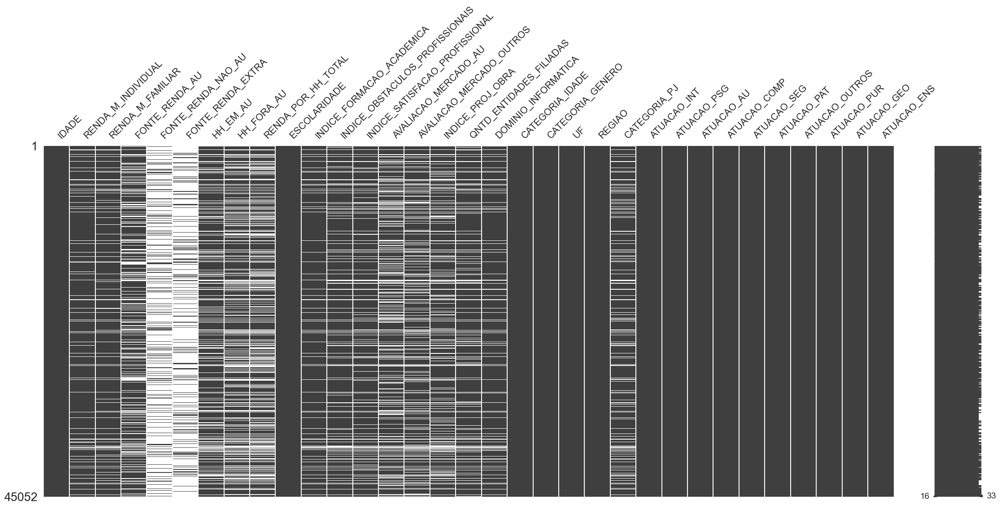

In [498]:
msno.matrix(df_selecao)

In [499]:
df_selecao.isna().sum()

IDADE                                  0
RENDA_M_INDIVIDUAL                  4169
RENDA_M_FAMILIAR                    5174
FONTE_RENDA_AU                     11316
FONTE_RENDA_NAO_AU                 37423
FONTE_RENDA_EXTRA                  37588
HH_EM_AU                            9555
HH_FORA_AU                         13084
RENDA_POR_HH_TOTAL                 14657
ESCOLARIDADE                           0
INDICE_FORMACAO_ACADEMICA           3940
INDICE_OBSTACULOS_PROFISSIONAIS     6281
INDICE_SATISFACAO_PROFISSIONAL      7061
AVALIACAO_MERCADO_AU               12193
AVALIACAO_MERCADO_OUTROS           10393
INDICE_PROJ_OBRA                   10173
QNTD_ENTIDADES_FILIADAS             7402
DOMINIO_INFORMATICA                 4748
CATEGORIA_IDADE                        0
CATEGORIA_GENERO                       1
UF                                     0
REGIAO                                 0
CATEGORIA_PJ                        7351
ATUACAO_INT                            0
ATUACAO_PSG     

In [481]:
df_selecao[df_selecao.CATEGORIA_GENERO.isna()].CATEGORIA_GENERO.index.array

<PandasArray>
[45385]
Length: 1, dtype: object

In [482]:
thresh_val = 20

<AxesSubplot:>

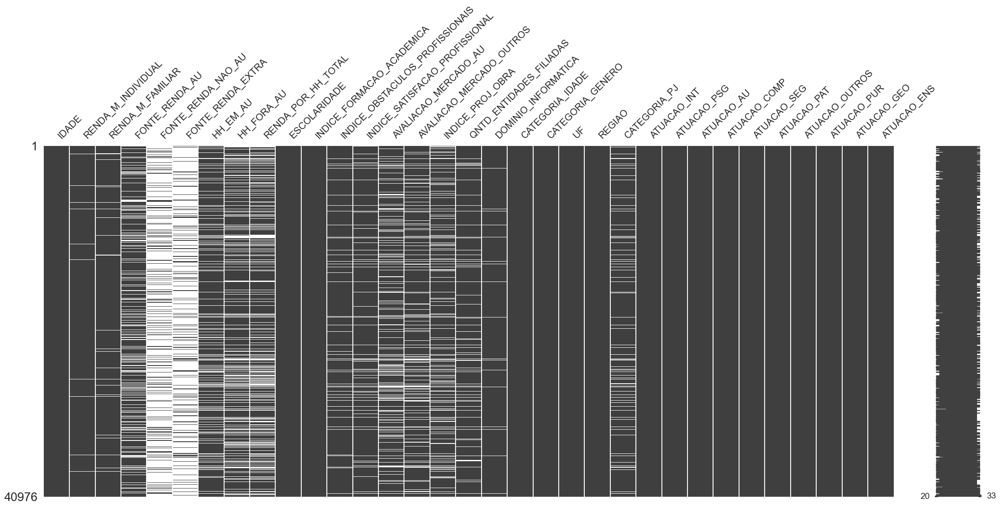

In [483]:
msno.matrix(df_selecao.dropna(thresh=thresh_val,axis=0))

The sparkline at right summarizes the general shape of the data completeness and points out the rows with the maximum and minimum nullity in the dataset.

<AxesSubplot:>

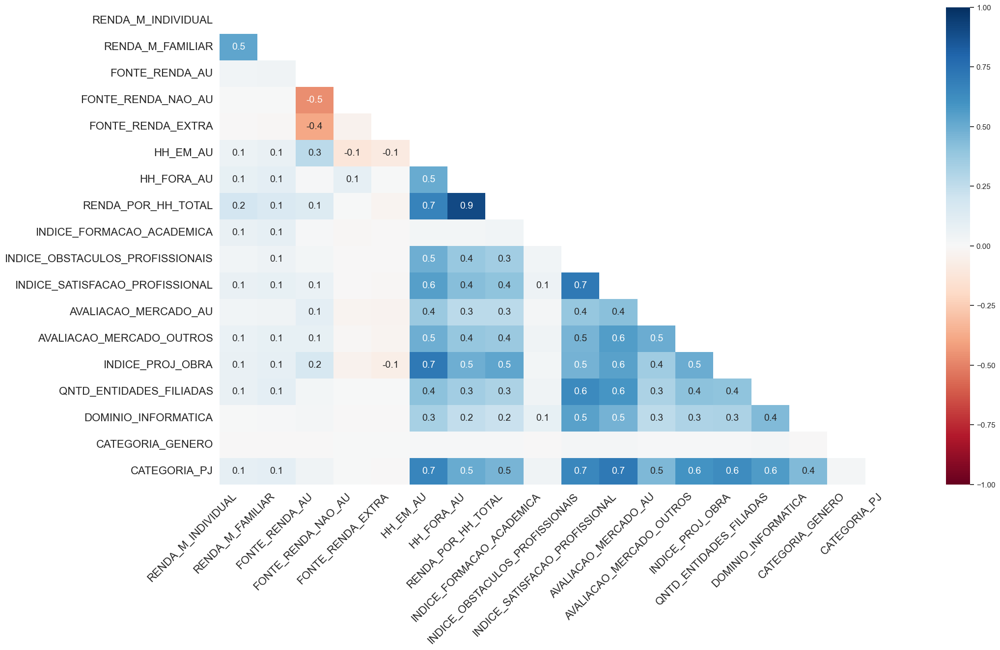

In [484]:
msno.heatmap(df_selecao.dropna(thresh=thresh_val,axis=0))

Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does).

Variables that are always full or always empty have no meaningful correlation, and so are silently removed from the visualization—in this case for instance the datetime and injury number columns, which are completely filled, are not included.

Entries marked <1 or >-1 have a correlation that is close to being exactingly negative or positive, but is still not quite perfectly so. This points to a small number of records in the dataset which are erroneous. For example, in this dataset the correlation between VEHICLE CODE TYPE 3 and CONTRIBUTING FACTOR VEHICLE 3 is <1, indicating that, contrary to our expectation, there are a few records which have one or the other, but not both. These cases will require special attention.msno.dendrogram(df3)

<AxesSubplot:>

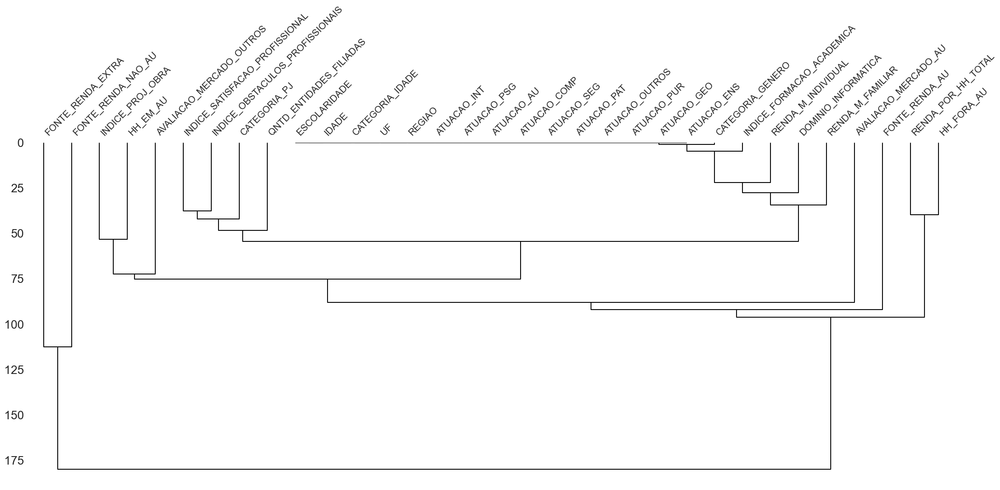

In [485]:
msno.dendrogram(df_selecao.dropna(thresh=thresh_val,axis=0))

To interpret this graph, read it from a top-down perspective. Cluster leaves which linked together at a distance of zero fully predict one another's presence—one variable might always be empty when another is filled, or they might always both be filled or both empty, and so on. In this specific example the dendrogram glues together the variables which are required and therefore present in every record.

<AxesSubplot:>

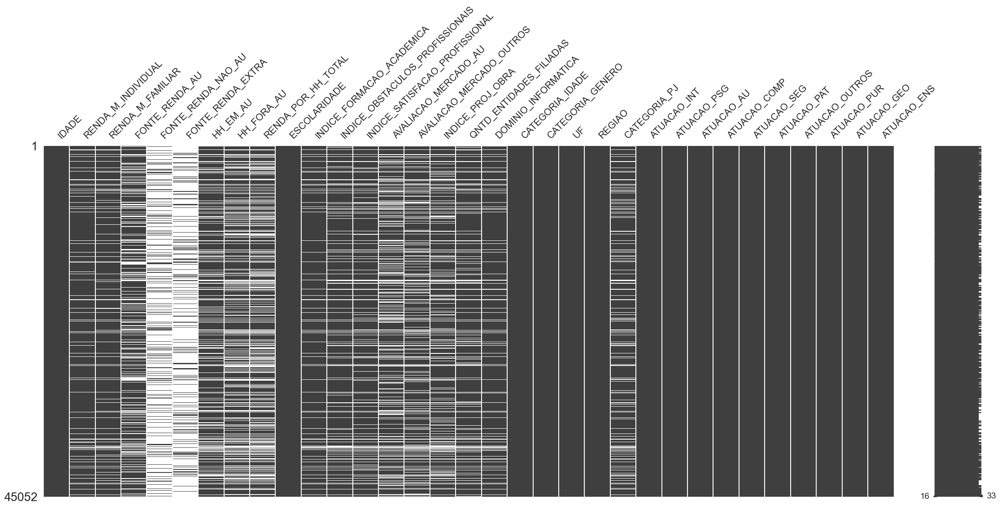

In [486]:
msno.matrix(df_selecao)

# Dataset

## Peeking

Peeking is a consequence of using test-set performance to both choose a hypothesis and evaluate it. The way to avoid this is to really hold the test set out—lock it away until you are completely done with learning and simply wish to obtain an independent evaluation of the final hypothesis.

Example: A learning algorithm has various “knobs” that can be twiddled to tune its behavior—for example, various different criteria for choosing the next attribute in decision tree learning. The researcher generates hypotheses for various different settings of the knobs, measures their error rates on the test set, and reports the error rate of the best hypothesis. Alas, peeking has occurred!

### Validation Set

If the test set is locked away, but you still want to measure performance on unseen data as a way of selecting a good hypothesis, then divide the available data (without the test set) into a training training set and a __validation set__. (RUSSEL and NORVIG, XXX, p.708).



### Data Mismatch
One solution is to hold out some of the training pictures (from the web) in yet another set that Andrew Ng calls the __train-dev set__. After the model is trained (on the training set, not on the train-dev set), you can evaluate it on the train-dev set.

If it performs well, then the model is not overfitting the training set. If it performs poorly on the validation set, the problem must be coming from the data mismatch. You can try to tackle this problem by preprocessing the web images to make them look more like the pictures that will be taken by the mobile app, and then retraining the model.

Conversely, if the model performs poorly on the train-dev set, then it must have over‐ fit the training set, so you should try to simplify or regularize the model, get more training data, and clean up the training data.

A model is a simplified version of the observations. The simplifications are meant to
discard the superfluous details that are unlikely to generalize to new instances. To
decide what data to discard and what data to keep, you must make assumptions. For
example, a linear model makes the assumption that the data is fundamentally linear
and that the distance between the instances and the straight line is just noise, which
can safely be ignored

Frame the Problem and Look at the Big Picture
1. Define the objective in business terms.
2. How will your solution be used?
3. What are the current solutions/workarounds (if any)?
4. How should you frame this problem (supervised/unsupervised, online/offline,
etc.)?
5. How should performance be measured?
6. Is the performance measure aligned with the business objective?
7. What would be the minimum performance needed to reach the business objec‐
tive?
8. What are comparable problems? Can you reuse experience or tools?
9. Is human expertise available?
10. How would you solve the problem manually?
11. List the assumptions you (or others) have made so far.
12. Verify assumptions if possible.

Get the Data
Note: automate as much as possible so you can easily get fresh data.
1. List the data you need and how much you need.
2. Find and document where you can get that data.
3. Check how much space it will take.
4. Check legal obligations, and get authorization if necessary.
5. Get access authorizations.
6. Create a workspace (with enough storage space).
7. Get the data.
8. Convert the data to a format you can easily manipulate (without changing the
data itself).
9. Ensure sensitive information is deleted or protected (e.g., anonymized).
10. Check the size and type of data (time series, sample, geographical, etc.).
11. Sample a test set, put it aside, and never look at it (no data snooping!)

Explore the Data
Note: try to get insights from a field expert for these steps.
1. Create a copy of the data for exploration (sampling it down to a manageable size
if necessary).
2. Create a Jupyter notebook to keep a record of your data exploration.
3. Study each attribute and its characteristics:
• Name
• Type (categorical, int/float, bounded/unbounded, text, structured, etc.)
% of missing values
• Noisiness and type of noise (stochastic, outliers, rounding errors, etc.)
• Usefulness for the task
• Type of distribution (Gaussian, uniform, logarithmic, etc.)
4. For supervised learning tasks, identify the target attribute(s).
5. Visualize the data.
6. Study the correlations between attributes.
7. Study how you would solve the problem manually.
8. Identify the promising transformations you may want to apply.
9. Identify extra data that would be useful (go back to “Get the Data” on page 756).
10. Document what you have learned

Prepare the Data
Notes:
• Work on copies of the data (keep the original dataset intact).
• Write functions for all data transformations you apply, for five reasons:
— So you can easily prepare the data the next time you get a fresh dataset
— So you can apply these transformations in future projects
— To clean and prepare the test set
— To clean and prepare new data instances once your solution is live
— To make it easy to treat your preparation choices as hyperparameters
1. Data cleaning:
• Fix or remove outliers (optional).
• Fill in missing values (e.g., with zero, mean, median…) or drop their rows (or
columns).
2. Feature selection (optional):
• Drop the attributes that provide no useful information for the task.
3. Feature engineering, where appropriate:
• Discretize continuous features
Decompose features (e.g., categorical, date/time, etc.).
• Add promising transformations of features (e.g., log(x), sqrt(x), x2, etc.).
• Aggregate features into promising new features.
4. Feature scaling:
• Standardize or normalize features.

Shortlist Promising Models
Notes:
• If the data is huge, you may want to sample smaller training sets so you can train
many different models in a reasonable time (be aware that this penalizes complex
models such as large neural nets or Random Forests).
• Once again, try to automate these steps as much as possible.
1. Train many quick-and-dirty models from different categories (e.g., linear, naive
Bayes, SVM, Random Forest, neural net, etc.) using standard parameters.
2. Measure and compare their performance.
• For each model, use N-fold cross-validation and compute the mean and stan‐
dard deviation of the performance measure on the N folds.
3. Analyze the most significant variables for each algorithm.
4. Analyze the types of errors the models make.
• What data would a human have used to avoid these errors?
5. Perform a quick round of feature selection and engineering.
6. Perform one or two more quick iterations of the five previous steps.
7. Shortlist the top three to five most promising models, preferring models that
make different types of errors.

Fine-Tune the System
Notes:
• You will want to use as much data as possible for this step, especially as you move
toward the end of fine-tuning
As always, automate what you can.
1. Fine-tune the hyperparameters using cross-validation:
• Treat your data transformation choices as hyperparameters, especially when
you are not sure about them (e.g., if you’re not sure whether to replace missing
values with zeros or with the median value, or to just drop the rows).
• Unless there are very few hyperparameter values to explore, prefer random
search over grid search. If training is very long, you may prefer a Bayesian
optimization approach (e.g., using Gaussian process priors, as described by
Jasper Snoek et al.).1
2. Try Ensemble methods. Combining your best models will often produce better
performance than running them individually.
3. Once you are confident about your final model, measure its performance on the
test set to estimate the generalization error.
Don’t tweak your model after measuring the generalization error:
you would just start overfitting the test set.

## Best Hypothesis
You can think of the task of finding the best hypothesis as two tasks: model selection defines the OPTIMIZATION hypothesis space and then optimization finds the best hypothesis within that space

# Loss Function

In machine learning utility is what learners should maximize, and it is traditional to express utilities by means of a loss function. The loss function L(x, y, yˆ) is defined as the amount of utility lost by predicting h(x) = ˆ y when the correct answer is f(x) = y

In general small errors are better than large ones; two functions that implement that idea are the absolute value of the difference (called the L1 loss), and the square of the difference (called the L2 loss).

Absolute value loss: L1(y, yˆ) = |y − yˆ|

Squared error loss: L2(y, yˆ) = (y − yˆ)

Which regularization function should you pick? That depends on the specific problem, but L1 regularization has an important advantage: it tends to produce a sparse model. That is, it often sets many weights to zero, effectively declaring the corresponding attributes to be irrelevant. Hypotheses that
discard attributes can be easier for a human to understand, and may be less likely to overfit. (RUSSEL and NORVIG, XXX, p.708).

# Analise

In [487]:
import seaborn as sns
import matplotlib.pyplot as plt
from string import ascii_letters
from pandas.plotting import scatter_matrix
#from matplotlib import pyplot

In [ ]:
df_selecao.dropna(inplace=True)
#normalized_df=(df3-df3.mean())/df3.std()
#normalized_df=(df3-df3.min())/(df3.max()-df3.min())
#df_sns = normalized_df
df_sns = df_selecao.copy()

## Análise Geral

## Outliers

In [500]:
df_selecao.select_dtypes(include = ['float']).info()

<class 'pandas.core.frame.DataFrame'>
Index: 45052 entries, 2 to 45385
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   IDADE                            45052 non-null  float64
 1   RENDA_M_INDIVIDUAL               40883 non-null  float64
 2   RENDA_M_FAMILIAR                 39878 non-null  float64
 3   FONTE_RENDA_AU                   33736 non-null  float64
 4   FONTE_RENDA_NAO_AU               7629 non-null   float64
 5   FONTE_RENDA_EXTRA                7464 non-null   float64
 6   HH_EM_AU                         35497 non-null  float64
 7   HH_FORA_AU                       31968 non-null  float64
 8   RENDA_POR_HH_TOTAL               30395 non-null  float64
 9   ESCOLARIDADE                     45052 non-null  float64
 10  INDICE_FORMACAO_ACADEMICA        41112 non-null  float64
 11  INDICE_OBSTACULOS_PROFISSIONAIS  38771 non-null  float64
 12  INDICE_SATISFACAO_PROFI

<AxesSubplot:>

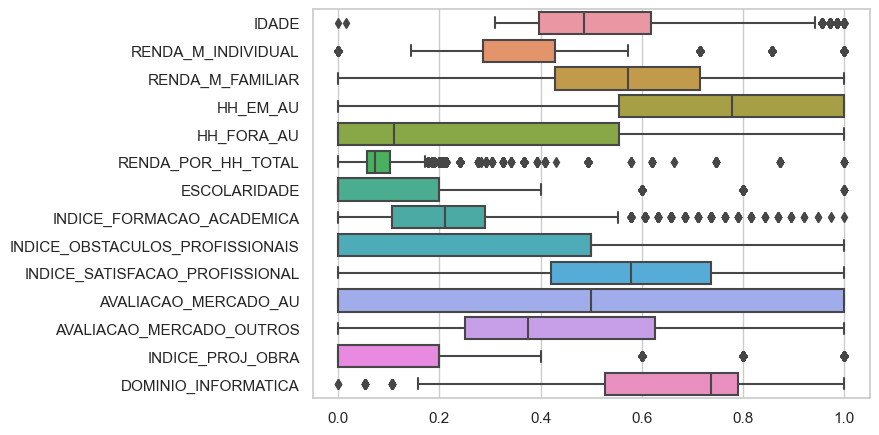

In [504]:
sns.set_theme(style="whitegrid")
#normalized_df=(df-df.mean())/df.std()
df_outliers = df_selecao.select_dtypes(include = ['float'])
df_outliers.drop(
    labels=['ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS','CATEGORIA_IDADE','QNTD_ENTIDADES_FILIADAS','FONTE_RENDA_NAO_AU','FONTE_RENDA_AU','FONTE_RENDA_EXTRA'],
    axis=1,
    inplace=True
)
df_outliers = (df_outliers - df_outliers.min()) / (df_outliers.max() - df_outliers.min())
sns.boxplot(
    data=df_outliers,
    orient='h'
)

In [505]:
df_selecao

,IDADE,RENDA_M_INDIVIDUAL,RENDA_M_FAMILIAR,FONTE_RENDA_AU,FONTE_RENDA_NAO_AU,FONTE_RENDA_EXTRA,HH_EM_AU,HH_FORA_AU,RENDA_POR_HH_TOTAL,ESCOLARIDADE,...,ATUACAO_INT,ATUACAO_PSG,ATUACAO_AU,ATUACAO_COMP,ATUACAO_SEG,ATUACAO_PAT,ATUACAO_OUTROS,ATUACAO_PUR,ATUACAO_GEO,ATUACAO_ENS
2,40.0,3.0,3.0,1.0,NaN,NaN,4.0,0.5,0.666667,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,27.0,3.0,6.0,1.0,NaN,NaN,NaN,NaN,NaN,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,25.0,2.0,3.0,1.0,NaN,NaN,2.0,1.0,0.666667,1.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,33.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,29.0,4.0,4.0,1.0,NaN,NaN,5.0,1.0,0.666667,1.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45381,38.0,3.0,3.0,NaN,1.0,NaN,NaN,4.0,NaN,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
45382,52.0,1.0,1.0,1.0,NaN,NaN,0.5,0.5,1.000000,2.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
45383,40.0,4.0,4.0,1.0,NaN,NaN,5.0,3.0,0.500000,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
45384,40.0,4.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [506]:
df_selecao[(np.abs(stats.zscore(df_outliers)) < 3).all(axis=1)]

,IDADE,RENDA_M_INDIVIDUAL,RENDA_M_FAMILIAR,FONTE_RENDA_AU,FONTE_RENDA_NAO_AU,FONTE_RENDA_EXTRA,HH_EM_AU,HH_FORA_AU,RENDA_POR_HH_TOTAL,ESCOLARIDADE,...,ATUACAO_INT,ATUACAO_PSG,ATUACAO_AU,ATUACAO_COMP,ATUACAO_SEG,ATUACAO_PAT,ATUACAO_OUTROS,ATUACAO_PUR,ATUACAO_GEO,ATUACAO_ENS


In [494]:
from scipy import stats
for coluna in df_outliers. columns.tolist():
    df_selecao[(np.abs(stats.zscore(df_selecao[coluna])) < 3).all(axis=1)]

AxisError: axis 1 is out of bounds for array of dimension 1

### Histogramas das Variáveis Básicas

<AxesSubplot:xlabel='IDADE', ylabel='Probability'>

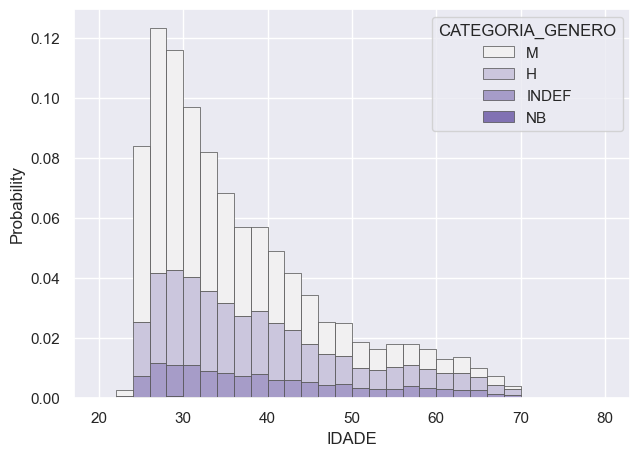

In [273]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="IDADE", hue="CATEGORIA_GENERO",
    #x="IDADE", hue="CATEGORIA_PJ",
    #x="IDADE", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=20,
    binrange=(20,80), alpha=1, binwidth=2
)

<AxesSubplot:xlabel='RENDA_POR_HH_TOTAL', ylabel='Probability'>

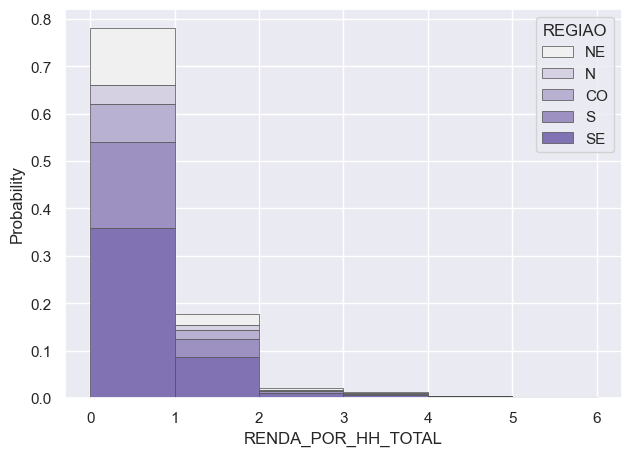

In [275]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_GENERO",
    #x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_PJ",
    x="RENDA_POR_HH_TOTAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=6,
    binrange=(0,6), alpha=1, binwidth=1
)

In [306]:
from scipy.stats import ks_2samp
from scipy.stats import shapiro
s_stat, s_pval = shapiro(df_selecao['RENDA_POR_HH_TOTAL'])
print(f'\n Teste de normalidade de Shapiro-Wilkstat: {s_stat}','\n',f'p-value: {s_pval}')

s1 = df_selecao[['RENDA_POR_HH_TOTAL','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "M"')['RENDA_POR_HH_TOTAL']
s2 = df_selecao[['RENDA_POR_HH_TOTAL','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H"')['RENDA_POR_HH_TOTAL']
ks_stat, ks_pval = ks_2samp(s1,s2)
print(f'\n Teste de semelhança de Kolmogorov-Smirnoff: {ks_stat}','\n',f'p-value: {ks_pval}')


 Teste de normalidade de Shapiro-Wilkstat: 0.6252093315124512 
 p-value: 0.0

 Teste de semelhança de Kolmogorov-Smirnoff: 0.07930012726102542 
 p-value: 5.157939501509635e-27


C:\Users\Bruno\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


<AxesSubplot:xlabel='HH_EM_AU', ylabel='Probability'>

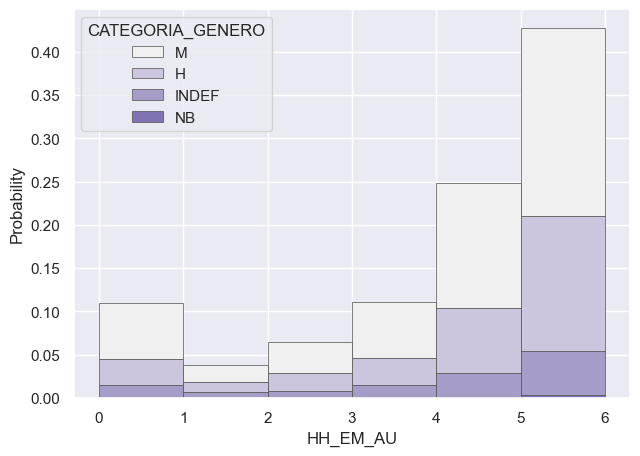

In [276]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="HH_EM_AU", hue="CATEGORIA_GENERO",
    #x="HH_EM_AU", hue="CATEGORIA_PJ",
    #x="HH_EM_AU", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

<AxesSubplot:xlabel='RENDA_M_INDIVIDUAL', ylabel='Probability'>

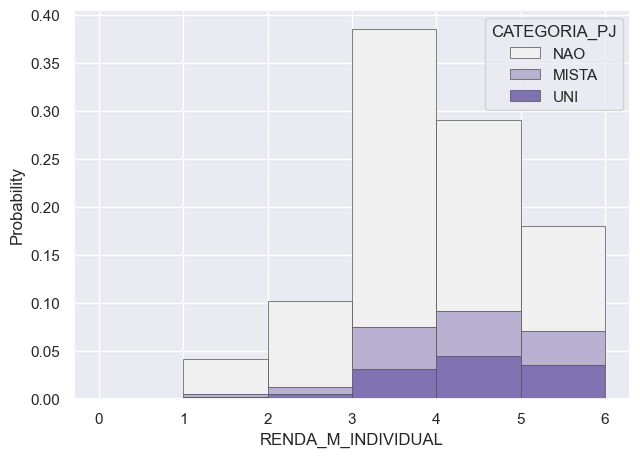

In [312]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_GENERO",
    x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_PJ",
    #x="RENDA_M_INDIVIDUAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

In [316]:
from scipy.stats import ks_2samp
from scipy.stats import shapiro
#s_stat, s_pval = shapiro(df_selecao['RENDA_M_INDIVIDUAL'])
#print(f'\n Teste de normalidade de Shapiro-Wilkstat: {s_stat}','\n',f'p-value: {s_pval}')

s1 = df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_PJ']].query('CATEGORIA_PJ == "NAO"')['RENDA_M_INDIVIDUAL']
s2 = df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_PJ']].query('CATEGORIA_PJ == "UNI"')['RENDA_M_INDIVIDUAL']
ks_stat, ks_pval = ks_2samp(s1,s2)
print(f'\n Teste de semelhança de Kolmogorov-Smirnoff: {ks_stat}','\n',f'p-value: {ks_pval}')


 Teste de semelhança de Kolmogorov-Smirnoff: 0.2723253436072819 
 p-value: 1.2618124856229967e-160


<AxesSubplot:xlabel='INDICE_SATISFACAO_PROFISSIONAL', ylabel='Probability'>

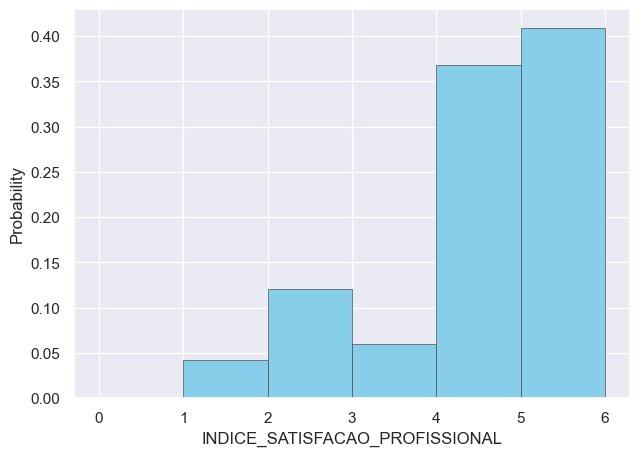

In [317]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="INDICE_SATISFACAO_PROFISSIONAL", color="skyblue",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_GENERO",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_PJ",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

<AxesSubplot:xlabel='INDICE_FORMACAO_ACADEMICA', ylabel='Probability'>

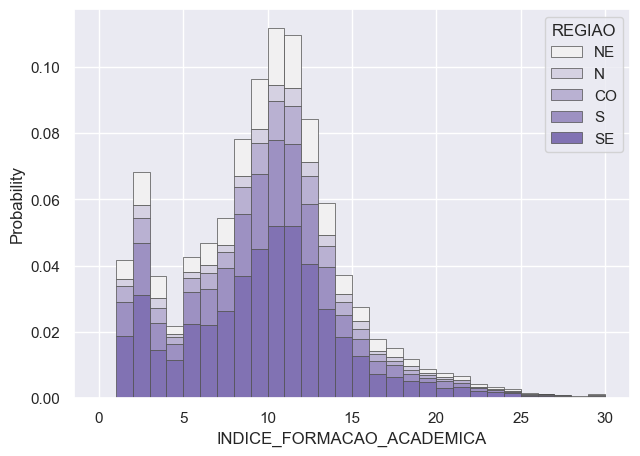

In [324]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="INDICE_FORMACAO_ACADEMICA", color="skyblue",
    #x="INDICE_FORMACAO_ACADEMICA", hue="CATEGORIA_GENERO",
    #x="INDICE_FORMACAO_ACADEMICA", hue="CATEGORIA_PJ",
    x="INDICE_FORMACAO_ACADEMICA", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,30), alpha=1, binwidth=1
)

<AxesSubplot:xlabel='CATEGORIA_IDADE', ylabel='INDICE_FORMACAO_ACADEMICA'>

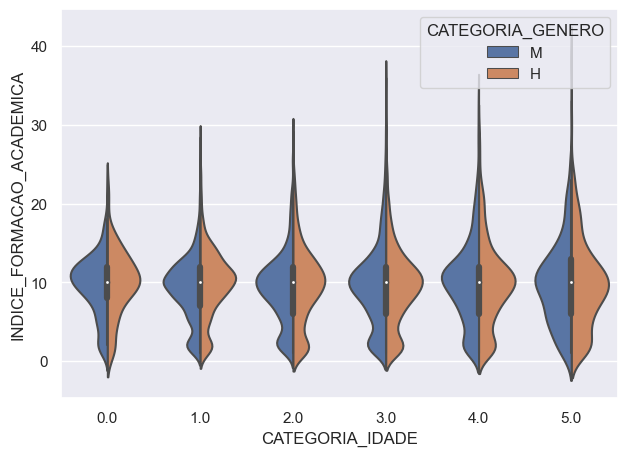

In [362]:
sns.violinplot(
    data=df_selecao[['INDICE_FORMACAO_ACADEMICA','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H" or CATEGORIA_GENERO == "M"'),
    y="INDICE_FORMACAO_ACADEMICA", x="CATEGORIA_IDADE", hue='CATEGORIA_GENERO', split=True
)

<AxesSubplot:xlabel='RENDA_M_INDIVIDUAL', ylabel='CATEGORIA_IDADE'>

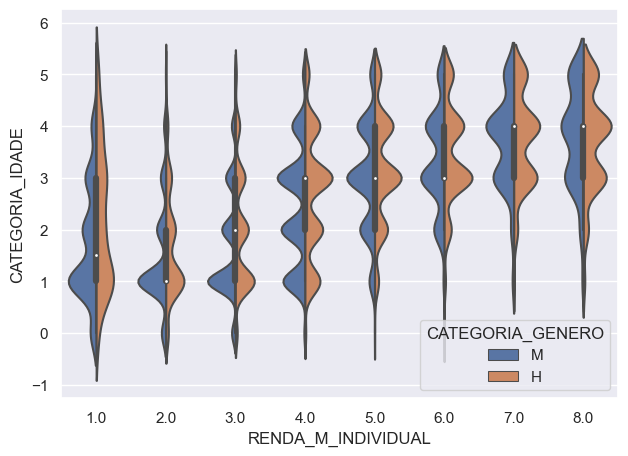

In [356]:
sns.violinplot(
    #data=df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO' == "H" or 'CATEGORIA_GENERO == "M"')['RENDA_M_INDIVIDUAL'],
    data=df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H" or CATEGORIA_GENERO == "M"'),
    x="RENDA_M_INDIVIDUAL", y="CATEGORIA_IDADE", hue="CATEGORIA_GENERO", split=True
)

## Correlação de Pearson e Gráficos de Dispersão

In [ ]:
df_sns = df_selecao.drop(labels=['IDADE','ATUACAO_ENS','ATUACAO_PUR','ATUACAO_OUTROS','ATUACAO_GEO','ATUACAO_GEO','ATUACAO_GEO','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_GEO','ATUACAO_PSG','ATUACAO_INT','ATUACAO_AU','REGIAO','UF','CATEGORIA_IDADE'],axis=1)

In [ ]:
sns.set_theme(style="darkgrid")
corr = df_sns.corr(method='spearman')
#corr = df_sns.corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(16, 16))

cmap = sns.color_palette("vlag_r", as_cmap=True)
#cmap = sns.color_palette("viridis", as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.4, vmin=-.4, center=0,
            annot=True, square=True, linewidths=.9, cbar_kws={"shrink": .5})

## Pairplot, por Região ou Estado

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO']]
sns.pairplot(df_sns, hue="REGIAO", kind='scatter')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#sns.pairplot(df_sns, hue="UF")

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO']]
sns.pairplot(df_sns, hue="IDADE", kind='scatter', diag_kind='kde')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#diag_kind{‘auto’, ‘hist’, ‘kde’, None}

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO','CATEGORIA_PJ']]
sns.pairplot(df_sns, hue="CATEGORIA_PJ")

## Renda Média Individual, Renda por HH, Índice de Satisfação Profissional por Região, PJ e Idade.

### Explorando a Renda Média Individual

<AxesSubplot:xlabel='REGIAO', ylabel='RENDA_M_INDIVIDUAL'>

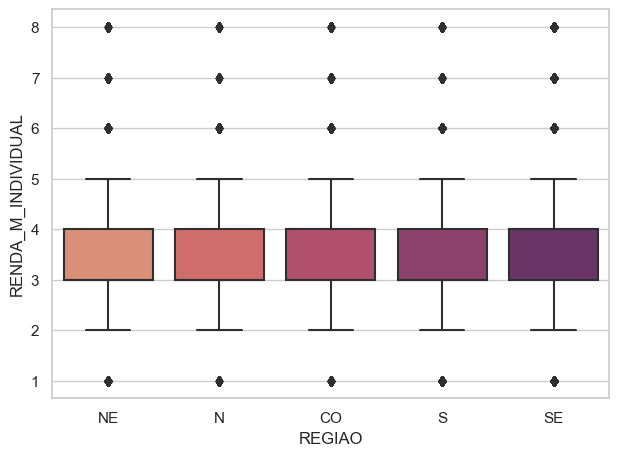

In [364]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

<AxesSubplot:xlabel='CATEGORIA_PJ', ylabel='RENDA_M_INDIVIDUAL'>

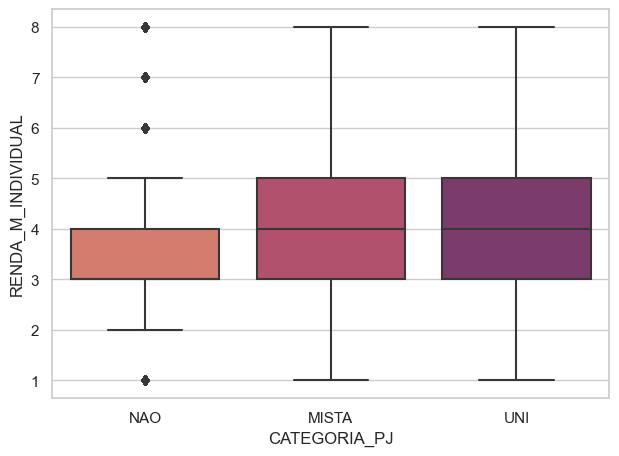

In [365]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

<AxesSubplot:xlabel='RENDA_M_INDIVIDUAL', ylabel='Probability'>

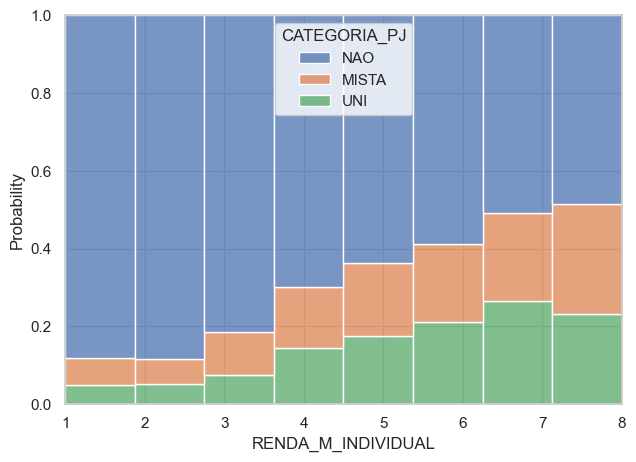

In [366]:
sns.histplot(data=df_selecao, x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_PJ", stat='probability', bins=8, common_bins=True, binrange=(1,8), common_norm=True, multiple='fill',)

<AxesSubplot:xlabel='CATEGORIA_IDADE', ylabel='RENDA_M_INDIVIDUAL'>

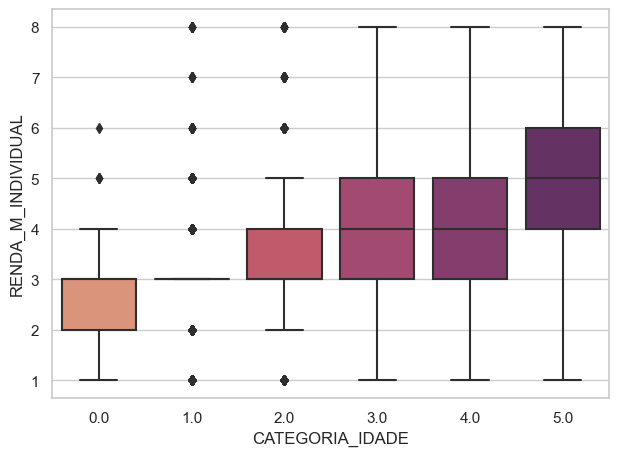

In [368]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

<AxesSubplot:xlabel='IDADE', ylabel='RENDA_M_INDIVIDUAL'>

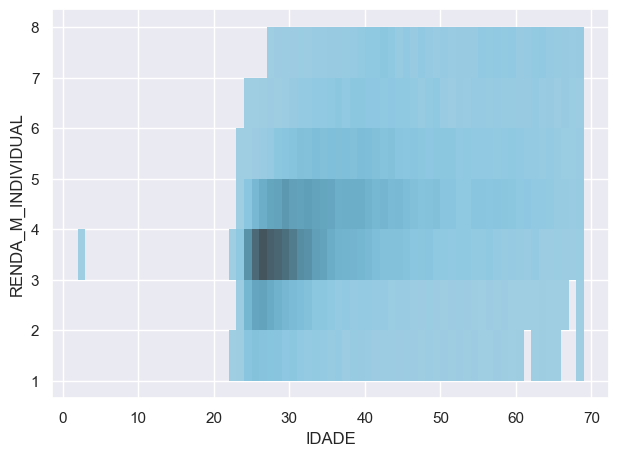

In [369]:
sns.set_theme(style="darkgrid")
sns.histplot(data=df_selecao, x="IDADE", y="RENDA_M_INDIVIDUAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

<AxesSubplot:xlabel='Probability', ylabel='RENDA_M_INDIVIDUAL'>

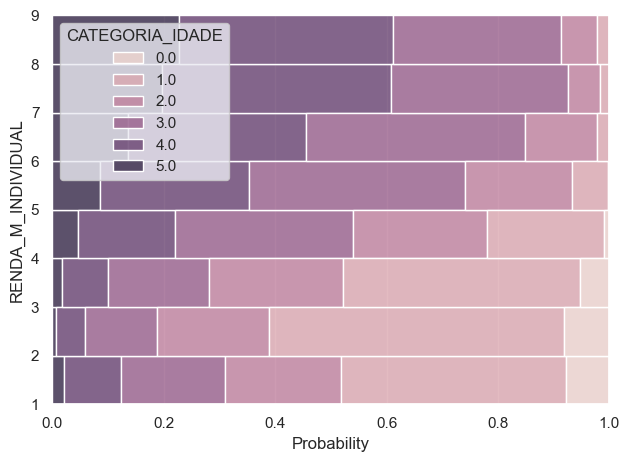

In [370]:
sns.histplot(data=df_selecao, y="RENDA_M_INDIVIDUAL", hue="CATEGORIA_IDADE", stat='probability', common_bins=True, binrange=(1,9), binwidth=1, multiple='fill',legend=True)

In [372]:
from sklearn.linear_model import LinearRegression
# Creating a Linear Regression model on our data
dado_1 = df_selecao['RENDA_M_INDIVIDUAL'].array.reshape(-1, 1)
dado_2 = df_selecao['INDICE_FORMACAO_ACADEMICA'].array.reshape(-1, 1)
reg = LinearRegression().fit(dado_1, dado_2)
reg.score(dado_1, dado_2)
# Creating a plot
#ax = df_selecao.plot.scatter(x='RENDA_M_INDIVIDUAL', y='INDICE_FORMACAO_ACADEMICA', alpha=.1)
#ax.plot(df_selecao['RENDA_M_INDIVIDUAL'], lin.predict(df_selecao[['INDICE_FORMACAO_ACADEMICA']]), c='r')

0.012616201832218232

### Explorando a Renda por HH Total

In [ ]:
sns.set_theme(style="whitegrid")

In [ ]:
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_PJ", stat='probability', bins=10, common_bins=True, binrange=(0,6), common_norm=True, multiple='fill',)

In [ ]:
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(data=df_selecao, x="IDADE", y="RENDA_POR_HH_TOTAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, y="RENDA_POR_HH_TOTAL", hue="CATEGORIA_IDADE", stat='probability', common_bins=True, binrange=(0,8), binwidth=1, multiple='fill',legend=True)

In [ ]:
from sklearn.linear_model import LinearRegression
# Creating a Linear Regression model on our data
dado_1 = data['INDICE_FORMACAO_ACADEMICA'].array.reshape(-1, 1)
dado_2 = data['RENDA_POR_HH_TOTAL'].array.reshape(-1, 1)
reg = LinearRegression().fit(dado_1, dado_2)
reg.score(dado_1, dado_2)

### Explorando a Satisfação Profissional

In [ ]:
sns.set_theme(style="white")
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.histplot(data=df_selecao, x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_PJ", stat='probability', bins=20, common_bins=True, binrange=(0,20), common_norm=True, multiple='fill',)

In [ ]:
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.histplot(data=df_selecao, x="IDADE", y="INDICE_SATISFACAO_PROFISSIONAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, y="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_IDADE", stat='probability', common_bins=True, binrange=(0,20), binwidth=1, multiple='fill',legend=True)

## 2

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_IDADE", stat='probability', bins=20, common_bins=True, binrange=(0,6), common_norm=True, multiple='stack', kde=True)

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_IDADE", stat='probability', common_bins=True, binrange=(0,10), binwidth=1, multiple='stack')

In [ ]:
df_sns = df_selecao[['HH_EM_AU','HH_FORA_AU','RENDA_POR_HH_TOTAL','RENDA_M_INDIVIDUAL','FONTE_RENDA_AU']]
sns.pairplot(df_sns, hue='RENDA_M_INDIVIDUAL', kind='scatter', diag_kind='auto')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#diag_kind{‘auto’, ‘hist’, ‘kde’, None}

In [ ]:
sns.histplot(data=df_selecao, x="HH_EM_AU", y="RENDA_POR_HH_TOTAL", color="skyblue", stat='density', alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, x="HH_FORA_AU", y="RENDA_POR_HH_TOTAL", color="skyblue", stat='density', alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, x="HH_FORA_AU", y="HH_EM_AU", color="skyblue", stat='density', alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

## Classificação Não-Supervisionada

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
# Calculate the linkage: mergings
mergings = linkage(samples,method='complete')
# Plot the dendrogram, using varieties as labels
dendrogram(mergings,
           labels=varieties,
           leaf_rotation=90,
           leaf_font_size=6,
)
plt.show()

## Pré-Processamento

In [ ]:
msno.matrix(df_selecao)

In [ ]:
df_selecao.isna().sum()

In [ ]:
dict_fillna = {
    'IDADE': np.nan, 'RENDA_M_INDIVIDUAL':0, 'RENDA_M_FAMILIAR':0, 'FONTE_RENDA_AU':0, 'FONTE_RENDA_NAO_AU':0, 'FONTE_RENDA_EXTRA':0,
    'HH_EM_AU': np.nan,'HH_FORA_AU': np.nan,'RENDA_POR_HH_TOTAL': np.nan, 'ESCOLARIDADE': 0,
    'INDICE_FORMACAO_ACADEMICA': 0, 'INDICE_OBSTACULOS_PROFISSIONAIS': np.nan, 'INDICE_SATISFACAO_PROFISSIONAL': np.nan, 
    'AVALIACAO_MERCADO_AU': np.nan, 'AVALIACAO_MERCADO_OUTROS': np.nan, 'INDICE_PROJ_OBRA': np.nan,
    'QNTD_ENTIDADES_FILIADAS': 0,'DOMINIO_INFORMATICA': 0,'CATEGORIA_IDADE': 0,'CATEGORIA_GENERO': 'INDEF',
    'UF': np.nan, 'REGIAO': np.nan, 'CATEGORIA_PJ': np.nan,
    'ATUACAO_INT': 0, 'ATUACAO_PSG': 0, 'ATUACAO_AU': 0, 'ATUACAO_COMP': 0, 'ATUACAO_SEG': 0, 'ATUACAO_PAT': 0, 'ATUACAO_OUTROS': 0, 'ATUACAO_PUR': 0,
    'ATUACAO_GEO': 0, 'ATUACAO_ENS': 0,
              }

In [ ]:
#df_selecao[df_selecao['CATEGORIA_GENERO'].isna()] = 'INDEF'

In [82]:
df_selecao.fillna(value=dict_fillna,inplace=True)

<AxesSubplot:>

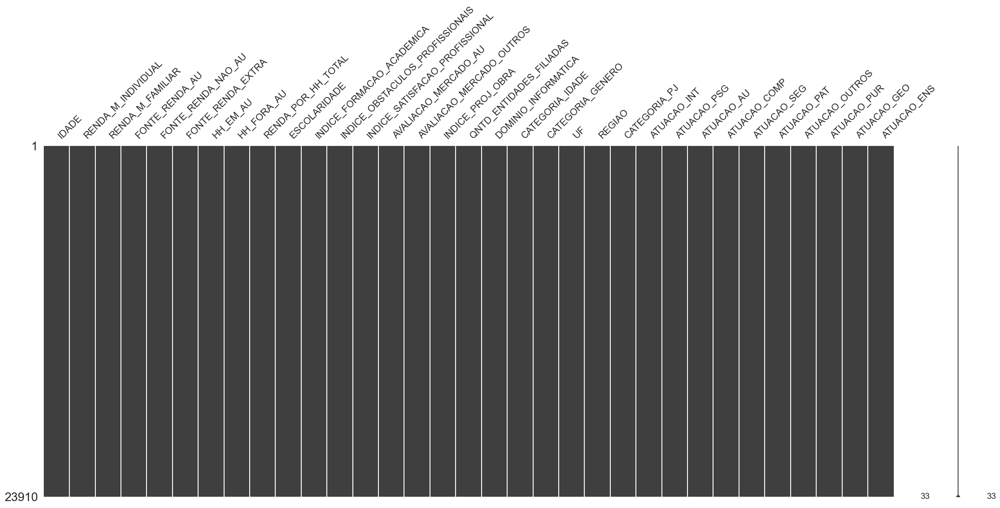

In [381]:
msno.matrix(df_selecao)

In [91]:
df_selecao.dropna(inplace=True)

In [382]:
conjunto_features_1 = df_selecao.drop(
    ['CATEGORIA_IDADE','UF','REGIAO','CATEGORIA_GENERO'],
    axis=1)

features = conjunto_features_1

In [393]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23910 entries, 2 to 45383
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   IDADE                            23910 non-null  float64
 1   RENDA_M_INDIVIDUAL               23910 non-null  float64
 2   RENDA_M_FAMILIAR                 23910 non-null  float64
 3   FONTE_RENDA_AU                   23910 non-null  float64
 4   FONTE_RENDA_NAO_AU               23910 non-null  float64
 5   FONTE_RENDA_EXTRA                23910 non-null  float64
 6   HH_EM_AU                         23910 non-null  float64
 7   HH_FORA_AU                       23910 non-null  float64
 8   RENDA_POR_HH_TOTAL               23910 non-null  float64
 9   ESCOLARIDADE                     23910 non-null  float64
 10  INDICE_FORMACAO_ACADEMICA        23910 non-null  float64
 11  INDICE_OBSTACULOS_PROFISSIONAIS  23910 non-null  float64
 12  INDICE_SATISFACAO_PROFI

In [392]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
features_categoricas = ['CATEGORIA_PJ','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS']
#features['CATEGORIA_PJ'] = le.fit_transform(features['CATEGORIA_PJ'])
for feature_categorica in features_categoricas:
    features[feature_categorica] = le.fit_transform(features[feature_categorica])
#y = le.transform(y)

In [394]:
features = features.dropna().to_numpy()

In [395]:
features.shape

(23910, 29)

In [396]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
#scaler = StandardScaler()
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(features)

In [ ]:
from sklearn.pipeline import make_pipeline
estimator = make_pipeline(StandardScaler(), kmeans).fit(data)

An alternative standardization is scaling features to lie between a given minimum and maximum value, often between zero and one, or so that the maximum absolute value of each feature is scaled to unit size. This can be achieved using MinMaxScaler or MaxAbsScaler, respectively. The motivation to use this scaling include robustness to very small standard deviations of features and preserving zero entries in sparse data.

If your data contains many outliers, scaling using the mean and variance of the data is likely to not work very well. In these cases, you can use RobustScaler as a drop-in replacement instead. It uses more robust estimates for the center and range of your data.

It is sometimes not enough to center and scale the features independently, since a downstream model can further make some assumption on the linear independence of the features. To address this issue you can use PCA with whiten=True to further remove the linear correlation across features.

In [397]:
scaled_features[:2]

array([[0.56716418, 0.28571429, 0.375     , 0.25      , 0.        ,
        0.        , 0.77777778, 0.        , 0.07172996, 0.        ,
        0.20512821, 0.        , 0.78947368, 0.        , 0.5       ,
        0.2       , 0.        , 0.8       , 0.5       , 1.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.40298507, 0.42857143, 0.5       , 0.25      , 0.        ,
        0.        , 1.        , 0.11111111, 0.07172996, 0.        ,
        0.1025641 , 0.5       , 0.42105263, 0.5       , 0.375     ,
        0.        , 0.        , 0.5       , 0.5       , 1.        ,
        0.        , 1.        , 1.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ]])

In [418]:
from sklearn.decomposition import PCA
pca = PCA(
    n_components=12, whiten=True,
)
pca_samples = pca.fit(scaled_features).transform(scaled_features)
print(
    '\n Total de variância explicada: {}'.format(pca.explained_variance_ratio_.sum()),'\n',
    'Explicação de variância por Componente Principal: {}'.format(pca.explained_variance_ratio_),
    '\n Variância de rúido: {}'.format(pca.noise_variance_)
)


 Total de variância explicada: 0.7978388350055865 
 Explicação de variância por Componente Principal: [0.11996038 0.10997865 0.08907097 0.08346359 0.06419049 0.06186387
 0.05626698 0.05443613 0.04750509 0.04154735 0.03752564 0.03202969] 
 Variância de rúido: 0.027728028781361255


In [415]:
from sklearn.decomposition import KernelPCA
kernel_pca = KernelPCA(
    n_components=12, kernel="rbf", gamma=None, fit_inverse_transform=False, alpha=1
)
pca_samples = kernel_pca.fit(scaled_features).transform(scaled_features)

In [416]:
ps = pd.DataFrame(pca_samples)
ps.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.118404,0.092499,-0.202101,-0.004907,-0.006766,0.079529,-0.049532,-0.013301,-0.019169,-0.039663,-0.002094,0.022477
1,-0.096100,-0.059201,0.092321,0.017847,0.018017,-0.027922,-0.179709,-0.062239,-0.045132,-0.076121,-0.057216,-0.036568
2,0.107362,-0.099342,-0.008864,-0.178069,-0.027887,0.043802,0.054396,-0.038535,-0.086608,-0.066700,-0.068780,0.004180
3,-0.124222,-0.033020,-0.031460,-0.099141,-0.042193,-0.014144,0.017919,-0.089244,0.001061,-0.082847,-0.019149,0.015537
4,0.060413,-0.254226,-0.043058,0.057402,0.139173,0.033366,-0.097271,0.069192,-0.002800,-0.149988,0.077780,0.077525


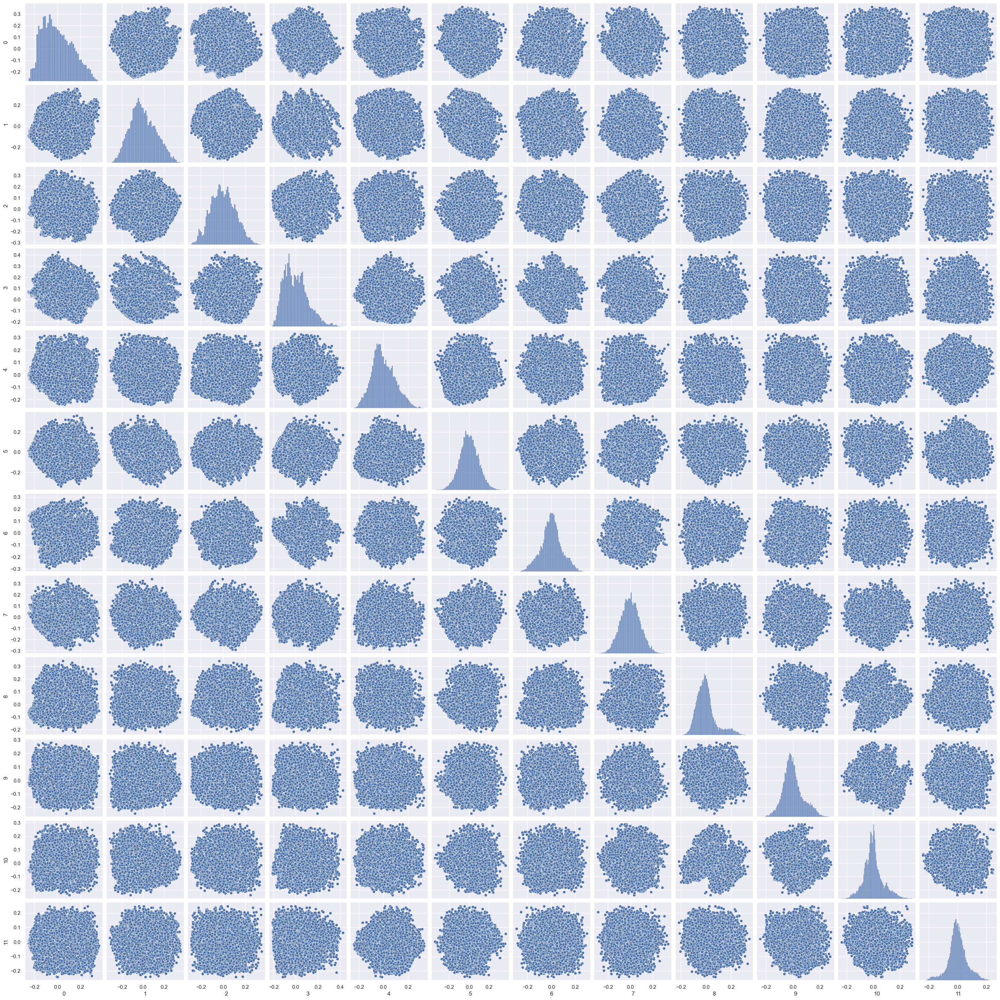

In [417]:
sns.pairplot(ps)

(23910, 2)
         13        12
0 -0.287221  0.162612
1 -0.256884  0.270027
2 -0.686581  1.073234
3 -0.016178  0.287160
4 -0.712055  0.093422


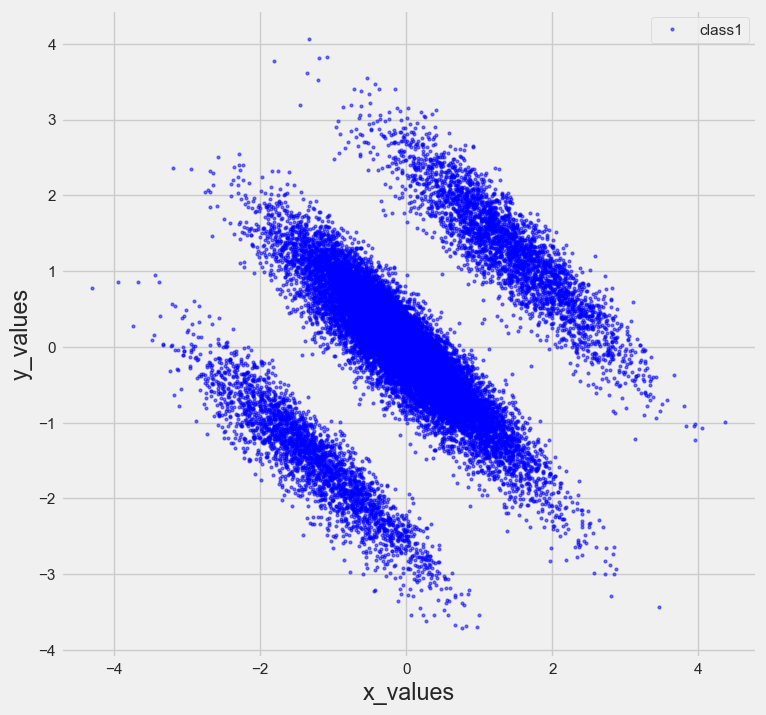

In [222]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d

a1 = 13
a2 = 12
tocluster = pd.DataFrame(ps[[a1,a2]])
print (tocluster.shape)
print (tocluster.head())

fig = plt.figure(figsize=(8,8))
plt.plot(tocluster[a1], tocluster[a2], 'o', markersize=2, color='blue', alpha=0.5, label='class1')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

### K-means

In [374]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

In [375]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

clusterer = KMeans(n_clusters=8,random_state=42).fit(tocluster)
centers = clusterer.cluster_centers_
c_preds = clusterer.predict(tocluster)
print(centers)

[[-0.34733357  0.30099419]
 [ 1.1204105  -1.14376494]
 [-1.80666736 -0.99426468]
 [ 2.06412374  0.67420758]
 [ 0.2796636  -0.3364684 ]
 [ 0.83900789  1.82061088]
 [-0.58278511 -2.13978072]
 [-1.09708795  1.02470103]]


In [379]:
from sklearn import metrics
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.silhouette_score
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]

SyntaxError: invalid syntax (823648699.py, line 5)

In [225]:
print (c_preds[0:100])

[0 0 7 0 0 7 1 4 1 5 0 2 0 4 0 4 7 7 4 4 0 4 1 2 0 4 1 3 7 3 0 5 4 0 7 7 0
 0 0 1 4 7 4 7 5 0 1 0 1 0 4 4 5 3 7 1 4 3 4 4 1 6 0 2 7 4 1 3 4 1 3 7 3 0
 4 0 1 4 0 4 1 4 4 4 4 0 4 6 6 0 0 5 3 3 2 1 7 6 0 5]


['orange', 'orange', 'black', 'orange', 'orange', 'black', 'blue', 'red', 'blue', 'orange']


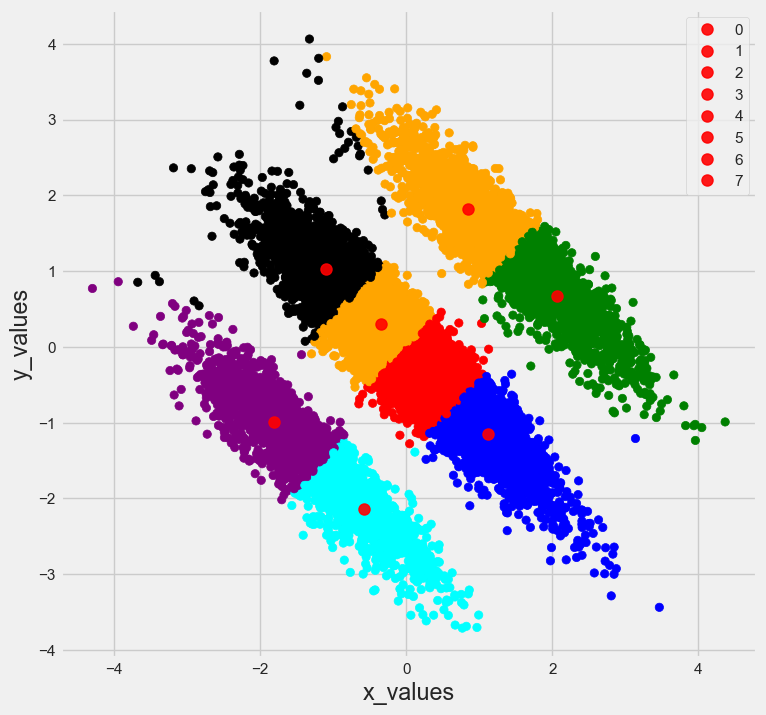

In [226]:
import matplotlib
fig = plt.figure(figsize=(8,8))
colors = ['orange','blue','purple','green','red','orange','cyan','black']
colored = [colors[k] for k in c_preds]
print (colored[0:10])
plt.scatter(tocluster[a1],tocluster[a2],  color = colored)
for ci,c in enumerate(centers):
    plt.plot(c[0], c[1], 'o', markersize=8, color='red', alpha=0.9, label=''+str(ci))

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.show()

In [104]:
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   "random_state": 42,
    "algorithm": "elkan"
   }
#algorithm{“lloyd”, “elkan”, “auto”, “full”}, default=”lloyd”

In [227]:
sse = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

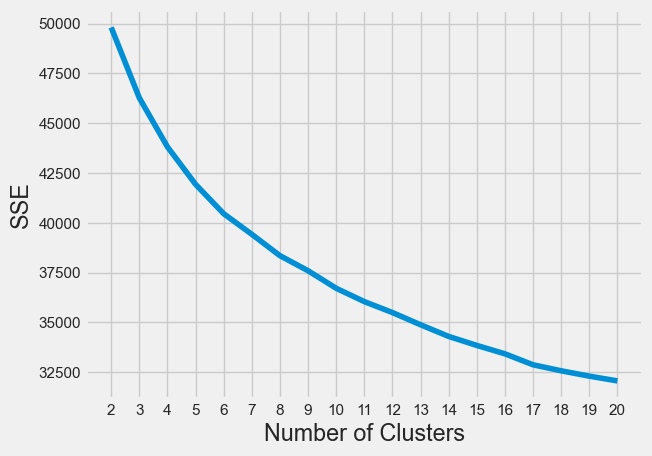

In [228]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 21), sse)
plt.xticks(range(2, 21))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [229]:
kl = KneeLocator(
   range(2, 21), sse, curve="convex", direction="decreasing"
   )

kl.elbow

8

In [111]:
silhouette_coefficients = []
for k in range(2, 21):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(scaled_features)
   score = silhouette_score(scaled_features, kmeans.labels_)
   silhouette_coefficients.append(score)

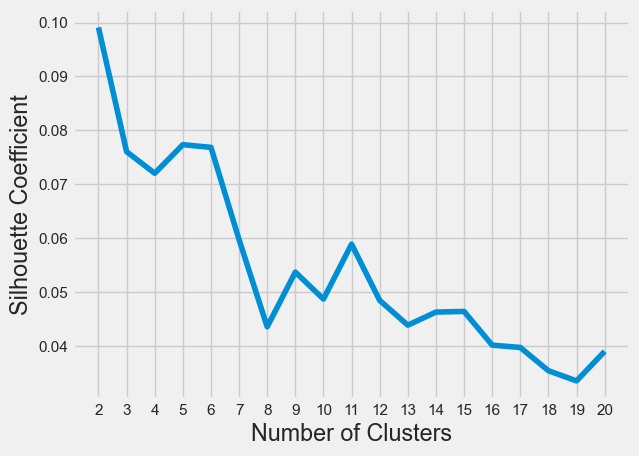

In [112]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 21), silhouette_coefficients)
plt.xticks(range(2, 21))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [115]:
kmeans = KMeans(
    algorithm="elkan",
    init="random",
    n_clusters=11,
    n_init=30,
    max_iter=500,
    random_state=42,
    #n_jobs=-2,
    #precompute_distances=True,
   )

In [116]:
kmeans.fit(scaled_features)

KMeans(algorithm='elkan', init='random', max_iter=500, n_clusters=11, n_init=30,
       random_state=42)

In [117]:
kmeans.inertia_

491376.7101831275

Inertia is not a normalized metric. The lower values of inertia are better and zero is optimal, but in very high-dimensional spaces, euclidean distances tend to become inflated (this is an instance of curse of dimensionality).

Running a dimensionality reduction algorithm such as PCA prior to k-means clustering can alleviate this problem and speed up the computations.

In [118]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

In [ ]:
correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

In [119]:
kmeans.n_iter_

31